In [444]:
from pandas import DataFrame
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from env import host, user, password

In [445]:
def get_connection(db, user = user, host = host, password = password):
    '''
    This function takes in as arguments the database, username, host, and password for 
    the mysql database and returns a string that can be used to open a connection to the server
    and query the db in the read_sql function. 
    '''
    return f'mysql+pymysql://{user}:{password}@{host}/{db}'

In [446]:
def telco_data():
    '''
    This function reads the telco data from the Codeup db into a df,
    write it to a csv file, and returns the df.
    '''
    # Create SQL query.
    sql_query = """
                SELECT * FROM customers
                JOIN contract_types USING(contract_type_id)
                JOIN internet_service_types USING(internet_service_type_id)
                JOIN payment_types USING(payment_type_id);
                """
    
    # Read in DataFrame from Codeup db.
    df = pd.read_sql(sql_query, get_connection('telco_churn'))
    
    return df

In [447]:
df = telco_data()

In [449]:
df.churn.value_counts(normalize = True)

No     0.73463
Yes    0.26537
Name: churn, dtype: float64

In [452]:
(df.tenure/12).max()

6.0

In [472]:
df.payment_type.value_counts()

Electronic check             2365
Mailed check                 1612
Bank transfer (automatic)    1544
Credit card (automatic)      1522
Name: payment_type, dtype: int64

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 24 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   payment_type_id           7043 non-null   int64  
 1   internet_service_type_id  7043 non-null   int64  
 2   contract_type_id          7043 non-null   int64  
 3   customer_id               7043 non-null   object 
 4   gender                    7043 non-null   object 
 5   senior_citizen            7043 non-null   int64  
 6   partner                   7043 non-null   object 
 7   dependents                7043 non-null   object 
 8   tenure                    7043 non-null   int64  
 9   phone_service             7043 non-null   object 
 10  multiple_lines            7043 non-null   object 
 11  online_security           7043 non-null   object 
 12  online_backup             7043 non-null   object 
 13  device_protection         7043 non-null   object 
 14  tech_sup

In [7]:
df.head(3).T

,0,1,2
payment_type_id,2,4,3
internet_service_type_id,1,1,1
contract_type_id,3,3,3
customer_id,0016-QLJIS,0017-DINOC,0019-GFNTW
gender,Female,Male,Female
senior_citizen,0,0,0
partner,Yes,No,No
dependents,Yes,No,No
tenure,65,54,56
phone_service,Yes,No,No


In [8]:
quantitatives = df.columns[[df[col].dtype == 'object' for col in df.columns]]
for col in quantitatives:
    print(df[col].value_counts())
    print('------------------------------------')

0016-QLJIS    1
5956-YHHRX    1
5998-VVEJY    1
5995-SNNEW    1
5989-PGKJB    1
             ..
9281-PKKZE    1
9269-CQOOL    1
9261-WDCAF    1
9259-PACGQ    1
9986-BONCE    1
Name: customer_id, Length: 7043, dtype: int64
------------------------------------
Male      3555
Female    3488
Name: gender, dtype: int64
------------------------------------
No     3641
Yes    3402
Name: partner, dtype: int64
------------------------------------
No     4933
Yes    2110
Name: dependents, dtype: int64
------------------------------------
Yes    6361
No      682
Name: phone_service, dtype: int64
------------------------------------
No                  3390
Yes                 2971
No phone service     682
Name: multiple_lines, dtype: int64
------------------------------------
No                     3498
Yes                    2019
No internet service    1526
Name: online_security, dtype: int64
------------------------------------
No                     3088
Yes                    2429
No internet

There are various columns with values other than yes or no... might need to replace some of those values...

In [9]:
df[df['multiple_lines'] == 'No phone service'].T

,1,2,3,5,7,8,10,16,17,18,...,2388,2390,2392,2395,2397,2408,2409,2411,2415,2416
payment_type_id,4,3,4,3,3,3,3,3,2,3,...,1,1,4,1,4,1,2,4,2,2
internet_service_type_id,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
contract_type_id,3,3,3,3,3,3,3,3,3,3,...,1,1,1,1,1,1,1,1,1,1
customer_id,0017-DINOC,0019-GFNTW,0056-EPFBG,0114-IGABW,0191-EQUUH,0214-JHPFW,0230-WEQUW,0277-ORXQS,0298-XACET,0301-FIDRB,...,9667-EQRXU,9693-XMUOB,9708-HPXWZ,9743-DQKQW,9754-CLVZW,9839-ETQOE,9842-EFSYY,9862-KJTYK,9895-VFOXH,9907-SWKKF
gender,Male,Female,Male,Female,Female,Female,Male,Male,Male,Female,...,Female,Male,Male,Male,Female,Male,Female,Male,Female,Female
senior_citizen,0,0,0,0,0,0,0,0,0,0,...,1,1,1,0,0,0,0,0,0,1
partner,No,No,Yes,Yes,No,Yes,Yes,Yes,Yes,Yes,...,No,Yes,No,No,Yes,No,No,No,No,No
dependents,No,No,Yes,No,Yes,No,No,Yes,Yes,Yes,...,No,No,No,No,Yes,Yes,Yes,Yes,No,No
tenure,54,56,20,71,25,70,66,66,52,72,...,30,59,5,3,26,43,4,19,1,1
phone_service,No,No,No,No,No,No,No,No,No,No,...,No,No,No,No,No,No,No,No,No,No


In [10]:
df[df['online_security'] == 'No'].T

,4,5,8,13,16,17,29,31,33,38,...,5506,5507,5508,5510,5511,5512,5513,5514,5515,5516
payment_type_id,3,3,3,1,3,2,4,2,3,3,...,3,1,1,1,3,1,1,4,2,1
internet_service_type_id,1,1,1,1,1,1,1,1,1,1,...,2,2,2,2,2,2,2,2,2,2
contract_type_id,3,3,3,3,3,3,3,3,3,3,...,1,1,1,1,1,1,1,1,1,1
customer_id,0078-XZMHT,0114-IGABW,0214-JHPFW,0253-ZTEOB,0277-ORXQS,0298-XACET,0440-EKDCF,0458-HEUZG,0487-CRLZF,0556-FJEGU,...,9944-AEXBM,9944-HKVVB,9947-OTFQU,9957-YODKZ,9961-JBNMK,9965-YOKZB,9971-ZWPBF,9974-JFBHQ,9985-MWVIX,9992-RRAMN
gender,Male,Female,Female,Female,Male,Male,Male,Female,Female,Male,...,Male,Female,Male,Male,Male,Male,Male,Male,Female,Male
senior_citizen,0,0,0,0,0,0,0,0,0,0,...,0,0,1,1,1,1,1,0,0,0
partner,Yes,Yes,Yes,Yes,Yes,Yes,Yes,No,No,No,...,No,No,No,Yes,No,No,Yes,No,No,Yes
dependents,No,No,No,Yes,Yes,Yes,No,No,No,No,...,No,No,No,No,No,No,Yes,Yes,No,No
tenure,72,71,70,48,66,52,62,13,49,58,...,32,3,15,6,21,9,34,64,1,22
phone_service,Yes,No,No,Yes,No,No,Yes,No,Yes,Yes,...,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes


In [11]:
df[df['online_backup'] == 'No internet service'].T

,5517,5518,5519,5520,5521,5522,5523,5524,5525,5526,...,7033,7034,7035,7036,7037,7038,7039,7040,7041,7042
payment_type_id,4,3,1,3,4,3,4,2,2,3,...,1,2,2,4,2,2,2,4,2,3
internet_service_type_id,3,3,3,3,3,3,3,3,3,3,...,3,3,3,3,3,3,3,3,3,3
contract_type_id,3,3,3,3,3,3,3,3,3,3,...,1,1,1,1,1,1,1,1,1,1
customer_id,0040-HALCW,0042-RLHYP,0057-QBUQH,0064-SUDOG,0071-NDAFP,0164-XAIRP,0174-QRVVY,0206-OYVOC,0224-NIJLP,0264-CNITK,...,9837-FWLCH,9860-LISIZ,9867-NNXLC,9929-PLVPA,9932-WBWIK,9962-BFPDU,9967-ATRFS,9970-QBCDA,9975-SKRNR,9986-BONCE
gender,Male,Female,Female,Female,Male,Female,Male,Female,Male,Female,...,Male,Female,Female,Female,Male,Female,Female,Female,Male,Female
senior_citizen,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
partner,Yes,Yes,No,Yes,Yes,No,Yes,Yes,Yes,Yes,...,Yes,No,No,No,No,Yes,No,No,No,No
dependents,Yes,Yes,Yes,Yes,Yes,No,Yes,Yes,Yes,Yes,...,Yes,No,No,Yes,No,Yes,No,No,No,No
tenure,54,69,43,12,25,24,71,46,8,71,...,12,34,22,4,11,1,19,6,1,4
phone_service,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,...,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes


In [12]:
df[df['device_protection'] == 'No internet service'].T

,5517,5518,5519,5520,5521,5522,5523,5524,5525,5526,...,7033,7034,7035,7036,7037,7038,7039,7040,7041,7042
payment_type_id,4,3,1,3,4,3,4,2,2,3,...,1,2,2,4,2,2,2,4,2,3
internet_service_type_id,3,3,3,3,3,3,3,3,3,3,...,3,3,3,3,3,3,3,3,3,3
contract_type_id,3,3,3,3,3,3,3,3,3,3,...,1,1,1,1,1,1,1,1,1,1
customer_id,0040-HALCW,0042-RLHYP,0057-QBUQH,0064-SUDOG,0071-NDAFP,0164-XAIRP,0174-QRVVY,0206-OYVOC,0224-NIJLP,0264-CNITK,...,9837-FWLCH,9860-LISIZ,9867-NNXLC,9929-PLVPA,9932-WBWIK,9962-BFPDU,9967-ATRFS,9970-QBCDA,9975-SKRNR,9986-BONCE
gender,Male,Female,Female,Female,Male,Female,Male,Female,Male,Female,...,Male,Female,Female,Female,Male,Female,Female,Female,Male,Female
senior_citizen,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
partner,Yes,Yes,No,Yes,Yes,No,Yes,Yes,Yes,Yes,...,Yes,No,No,No,No,Yes,No,No,No,No
dependents,Yes,Yes,Yes,Yes,Yes,No,Yes,Yes,Yes,Yes,...,Yes,No,No,Yes,No,Yes,No,No,No,No
tenure,54,69,43,12,25,24,71,46,8,71,...,12,34,22,4,11,1,19,6,1,4
phone_service,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,...,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes


In [13]:
df[df['tech_support'] == 'No internet service'].T

,5517,5518,5519,5520,5521,5522,5523,5524,5525,5526,...,7033,7034,7035,7036,7037,7038,7039,7040,7041,7042
payment_type_id,4,3,1,3,4,3,4,2,2,3,...,1,2,2,4,2,2,2,4,2,3
internet_service_type_id,3,3,3,3,3,3,3,3,3,3,...,3,3,3,3,3,3,3,3,3,3
contract_type_id,3,3,3,3,3,3,3,3,3,3,...,1,1,1,1,1,1,1,1,1,1
customer_id,0040-HALCW,0042-RLHYP,0057-QBUQH,0064-SUDOG,0071-NDAFP,0164-XAIRP,0174-QRVVY,0206-OYVOC,0224-NIJLP,0264-CNITK,...,9837-FWLCH,9860-LISIZ,9867-NNXLC,9929-PLVPA,9932-WBWIK,9962-BFPDU,9967-ATRFS,9970-QBCDA,9975-SKRNR,9986-BONCE
gender,Male,Female,Female,Female,Male,Female,Male,Female,Male,Female,...,Male,Female,Female,Female,Male,Female,Female,Female,Male,Female
senior_citizen,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
partner,Yes,Yes,No,Yes,Yes,No,Yes,Yes,Yes,Yes,...,Yes,No,No,No,No,Yes,No,No,No,No
dependents,Yes,Yes,Yes,Yes,Yes,No,Yes,Yes,Yes,Yes,...,Yes,No,No,Yes,No,Yes,No,No,No,No
tenure,54,69,43,12,25,24,71,46,8,71,...,12,34,22,4,11,1,19,6,1,4
phone_service,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,...,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes


In [14]:
df[df['streaming_tv'] == 'No internet service'].T

,5517,5518,5519,5520,5521,5522,5523,5524,5525,5526,...,7033,7034,7035,7036,7037,7038,7039,7040,7041,7042
payment_type_id,4,3,1,3,4,3,4,2,2,3,...,1,2,2,4,2,2,2,4,2,3
internet_service_type_id,3,3,3,3,3,3,3,3,3,3,...,3,3,3,3,3,3,3,3,3,3
contract_type_id,3,3,3,3,3,3,3,3,3,3,...,1,1,1,1,1,1,1,1,1,1
customer_id,0040-HALCW,0042-RLHYP,0057-QBUQH,0064-SUDOG,0071-NDAFP,0164-XAIRP,0174-QRVVY,0206-OYVOC,0224-NIJLP,0264-CNITK,...,9837-FWLCH,9860-LISIZ,9867-NNXLC,9929-PLVPA,9932-WBWIK,9962-BFPDU,9967-ATRFS,9970-QBCDA,9975-SKRNR,9986-BONCE
gender,Male,Female,Female,Female,Male,Female,Male,Female,Male,Female,...,Male,Female,Female,Female,Male,Female,Female,Female,Male,Female
senior_citizen,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
partner,Yes,Yes,No,Yes,Yes,No,Yes,Yes,Yes,Yes,...,Yes,No,No,No,No,Yes,No,No,No,No
dependents,Yes,Yes,Yes,Yes,Yes,No,Yes,Yes,Yes,Yes,...,Yes,No,No,Yes,No,Yes,No,No,No,No
tenure,54,69,43,12,25,24,71,46,8,71,...,12,34,22,4,11,1,19,6,1,4
phone_service,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,...,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes


In [15]:
df[df['streaming_movies'] == 'No internet service'].T

,5517,5518,5519,5520,5521,5522,5523,5524,5525,5526,...,7033,7034,7035,7036,7037,7038,7039,7040,7041,7042
payment_type_id,4,3,1,3,4,3,4,2,2,3,...,1,2,2,4,2,2,2,4,2,3
internet_service_type_id,3,3,3,3,3,3,3,3,3,3,...,3,3,3,3,3,3,3,3,3,3
contract_type_id,3,3,3,3,3,3,3,3,3,3,...,1,1,1,1,1,1,1,1,1,1
customer_id,0040-HALCW,0042-RLHYP,0057-QBUQH,0064-SUDOG,0071-NDAFP,0164-XAIRP,0174-QRVVY,0206-OYVOC,0224-NIJLP,0264-CNITK,...,9837-FWLCH,9860-LISIZ,9867-NNXLC,9929-PLVPA,9932-WBWIK,9962-BFPDU,9967-ATRFS,9970-QBCDA,9975-SKRNR,9986-BONCE
gender,Male,Female,Female,Female,Male,Female,Male,Female,Male,Female,...,Male,Female,Female,Female,Male,Female,Female,Female,Male,Female
senior_citizen,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
partner,Yes,Yes,No,Yes,Yes,No,Yes,Yes,Yes,Yes,...,Yes,No,No,No,No,Yes,No,No,No,No
dependents,Yes,Yes,Yes,Yes,Yes,No,Yes,Yes,Yes,Yes,...,Yes,No,No,Yes,No,Yes,No,No,No,No
tenure,54,69,43,12,25,24,71,46,8,71,...,12,34,22,4,11,1,19,6,1,4
phone_service,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,...,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes


In [16]:
df[df['internet_service_type'] == 'None'].T

,5517,5518,5519,5520,5521,5522,5523,5524,5525,5526,...,7033,7034,7035,7036,7037,7038,7039,7040,7041,7042
payment_type_id,4,3,1,3,4,3,4,2,2,3,...,1,2,2,4,2,2,2,4,2,3
internet_service_type_id,3,3,3,3,3,3,3,3,3,3,...,3,3,3,3,3,3,3,3,3,3
contract_type_id,3,3,3,3,3,3,3,3,3,3,...,1,1,1,1,1,1,1,1,1,1
customer_id,0040-HALCW,0042-RLHYP,0057-QBUQH,0064-SUDOG,0071-NDAFP,0164-XAIRP,0174-QRVVY,0206-OYVOC,0224-NIJLP,0264-CNITK,...,9837-FWLCH,9860-LISIZ,9867-NNXLC,9929-PLVPA,9932-WBWIK,9962-BFPDU,9967-ATRFS,9970-QBCDA,9975-SKRNR,9986-BONCE
gender,Male,Female,Female,Female,Male,Female,Male,Female,Male,Female,...,Male,Female,Female,Female,Male,Female,Female,Female,Male,Female
senior_citizen,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
partner,Yes,Yes,No,Yes,Yes,No,Yes,Yes,Yes,Yes,...,Yes,No,No,No,No,Yes,No,No,No,No
dependents,Yes,Yes,Yes,Yes,Yes,No,Yes,Yes,Yes,Yes,...,Yes,No,No,Yes,No,Yes,No,No,No,No
tenure,54,69,43,12,25,24,71,46,8,71,...,12,34,22,4,11,1,19,6,1,4
phone_service,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,...,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes


In [17]:
non_quantitatives = df.columns[[df[col].dtype != 'object' for col in df.columns]]
for col in non_quantitatives:
    print(df[col].describe())
    print('------------------------------------')

count    7043.000000
mean        2.315633
std         1.148907
min         1.000000
25%         1.000000
50%         2.000000
75%         3.000000
max         4.000000
Name: payment_type_id, dtype: float64
------------------------------------
count    7043.000000
mean        1.872923
std         0.737796
min         1.000000
25%         1.000000
50%         2.000000
75%         2.000000
max         3.000000
Name: internet_service_type_id, dtype: float64
------------------------------------
count    7043.000000
mean        1.690473
std         0.833755
min         1.000000
25%         1.000000
50%         1.000000
75%         2.000000
max         3.000000
Name: contract_type_id, dtype: float64
------------------------------------
count    7043.000000
mean        0.162147
std         0.368612
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: senior_citizen, dtype: float64
------------------------------------
count    7043.00000

In [18]:
# dropping duplicate values in df
df.drop_duplicates(inplace = True)

In [19]:
# replace values in columns multiple_lines, online_security,
# online_backup, device_protection, tech_support, streaming_tv, 
# streaming_movies and internet_service_type
df.replace(to_replace = {'No phone service':'No', 'No internet service':'No'}, inplace = True)

In [20]:
quantitatives = df.columns[[df[col].dtype == 'object' for col in df.columns]]
for col in quantitatives:
    print(df[col].value_counts())#normalize = True))
    print('------------------------------------')

0016-QLJIS    1
5956-YHHRX    1
5998-VVEJY    1
5995-SNNEW    1
5989-PGKJB    1
             ..
9281-PKKZE    1
9269-CQOOL    1
9261-WDCAF    1
9259-PACGQ    1
9986-BONCE    1
Name: customer_id, Length: 7043, dtype: int64
------------------------------------
Male      3555
Female    3488
Name: gender, dtype: int64
------------------------------------
No     3641
Yes    3402
Name: partner, dtype: int64
------------------------------------
No     4933
Yes    2110
Name: dependents, dtype: int64
------------------------------------
Yes    6361
No      682
Name: phone_service, dtype: int64
------------------------------------
No     4072
Yes    2971
Name: multiple_lines, dtype: int64
------------------------------------
No     5024
Yes    2019
Name: online_security, dtype: int64
------------------------------------
No     4614
Yes    2429
Name: online_backup, dtype: int64
------------------------------------
No     4621
Yes    2422
Name: device_protection, dtype: int64
---------------------

In [21]:
# dropping duplicate columns from SQL join
# dropping columns not necessary for churn analysis
dropped_columns = ['payment_type_id', 'internet_service_type_id', 'contract_type_id',
       'customer_id']
df_dropped = df.drop(columns = dropped_columns)

In [22]:
# change total_charges column dtype from object to float64 
df_dropped = df_dropped.replace(r'^\s*$', np.nan, regex = True)
df_dropped.total_charges = df_dropped.total_charges.astype('float64')

In [23]:
# getting object columns, minus churn, into a list to easily call the variable w/o having
# to go through each column
obj_cols_name = df_dropped.columns[[df_dropped[col].dtype == 'object' for col in df_dropped.columns]]
obj_cols_name = obj_cols_name.to_list()
obj_cols_name.remove('churn')

In [24]:
# adding dummy variables to non-numeric columns, concatenating dataframes and dropping 
# dummy 'parent' columns. 
df_dummies = pd.get_dummies(df_dropped[obj_cols_name], drop_first = False)
df_concat = pd.concat([df_dropped, df_dummies], axis = 1)
df_concat = df_concat.drop(columns = obj_cols_name)

In [25]:
df_concat.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 39 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   senior_citizen                          7043 non-null   int64  
 1   tenure                                  7043 non-null   int64  
 2   monthly_charges                         7043 non-null   float64
 3   total_charges                           7032 non-null   float64
 4   churn                                   7043 non-null   object 
 5   gender_Female                           7043 non-null   uint8  
 6   gender_Male                             7043 non-null   uint8  
 7   partner_No                              7043 non-null   uint8  
 8   partner_Yes                             7043 non-null   uint8  
 9   dependents_No                           7043 non-null   uint8  
 10  dependents_Yes                          7043 non-null   uint

In [26]:
print(pd.crosstab(df_concat.partner_No, df_concat.partner_Yes))
print(df.partner.value_counts())

partner_Yes     0     1
partner_No             
0               0  3402
1            3641     0
No     3641
Yes    3402
Name: partner, dtype: int64


In [27]:
print(pd.crosstab(df_concat.dependents_No, df_concat.dependents_Yes))
print(df.dependents.value_counts())

dependents_Yes     0     1
dependents_No             
0                  0  2110
1               4933     0
No     4933
Yes    2110
Name: dependents, dtype: int64


In [28]:
print(pd.crosstab(df_concat.phone_service_No, df_concat.phone_service_Yes))
print(df.phone_service.value_counts())

phone_service_Yes    0     1
phone_service_No            
0                    0  6361
1                  682     0
Yes    6361
No      682
Name: phone_service, dtype: int64


In [29]:
print(pd.crosstab(df_concat.multiple_lines_No, df_concat.multiple_lines_Yes))
print(df.multiple_lines.value_counts())

multiple_lines_Yes     0     1
multiple_lines_No             
0                      0  2971
1                   4072     0
No     4072
Yes    2971
Name: multiple_lines, dtype: int64


In [30]:
print(pd.crosstab(df_concat.online_security_No, df_concat.online_security_Yes))
print(df.online_security.value_counts())

online_security_Yes     0     1
online_security_No             
0                       0  2019
1                    5024     0
No     5024
Yes    2019
Name: online_security, dtype: int64


In [31]:
print(pd.crosstab(df_concat.online_backup_No, df_concat.online_backup_Yes))
print(df.online_backup.value_counts())

online_backup_Yes     0     1
online_backup_No             
0                     0  2429
1                  4614     0
No     4614
Yes    2429
Name: online_backup, dtype: int64


In [32]:
print(pd.crosstab(df_concat.device_protection_No, df_concat.device_protection_Yes))
print(df.device_protection.value_counts())

device_protection_Yes     0     1
device_protection_No             
0                         0  2422
1                      4621     0
No     4621
Yes    2422
Name: device_protection, dtype: int64


In [33]:
print(pd.crosstab(df_concat.tech_support_No, df_concat.tech_support_Yes))
print(df.tech_support.value_counts())

tech_support_Yes     0     1
tech_support_No             
0                    0  2044
1                 4999     0
No     4999
Yes    2044
Name: tech_support, dtype: int64


In [34]:
print(pd.crosstab(df_concat.streaming_tv_No, df_concat.streaming_tv_Yes))
print(df.streaming_tv.value_counts())

streaming_tv_Yes     0     1
streaming_tv_No             
0                    0  2707
1                 4336     0
No     4336
Yes    2707
Name: streaming_tv, dtype: int64


In [35]:
print(pd.crosstab(df_concat.streaming_movies_No, df_concat.streaming_movies_Yes))
print(df.streaming_movies.value_counts())

streaming_movies_Yes     0     1
streaming_movies_No             
0                        0  2732
1                     4311     0
No     4311
Yes    2732
Name: streaming_movies, dtype: int64


In [36]:
print(pd.crosstab(df_concat.paperless_billing_No, df_concat.paperless_billing_Yes))
print(df.paperless_billing.value_counts())

paperless_billing_Yes     0     1
paperless_billing_No             
0                         0  4171
1                      2872     0
Yes    4171
No     2872
Name: paperless_billing, dtype: int64


Need to drop various dummy columns. drop first set to false so that for columns that don't have binary choice, we can include the dummies from the values with more than two different values. Goal is to keep dummy columns for contract_type, internet_service_type and payment_type

In [37]:
# dropping dummy no columns from df and renaming and changing data type of senior_citizen
# for consistency purposes
dummy_no = [ 'partner_No', 'dependents_No', 'phone_service_No', 'multiple_lines_No', 
            'online_security_No', 'online_backup_No', 'device_protection_No', 
            'tech_support_No', 'streaming_tv_No', 'streaming_movies_No',
            'paperless_billing_No',]
dummy_drop = df_concat.drop(columns = dummy_no)
dummy_drop.rename(columns = {'senior_citizen':'senior_citizen_Yes'}, inplace = True)
dummy_drop.senior_citizen_Yes = dummy_drop.senior_citizen_Yes.astype('uint8')

In [38]:
# dropping 12 rows in dataframe related to missing values from the total charges column
df_cleaned = dummy_drop[dummy_drop.total_charges.notnull()]
df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7032 entries, 0 to 7042
Data columns (total 28 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   senior_citizen_Yes                      7032 non-null   uint8  
 1   tenure                                  7032 non-null   int64  
 2   monthly_charges                         7032 non-null   float64
 3   total_charges                           7032 non-null   float64
 4   churn                                   7032 non-null   object 
 5   gender_Female                           7032 non-null   uint8  
 6   gender_Male                             7032 non-null   uint8  
 7   partner_Yes                             7032 non-null   uint8  
 8   dependents_Yes                          7032 non-null   uint8  
 9   phone_service_Yes                       7032 non-null   uint8  
 10  multiple_lines_Yes                      7032 non-null   uint

In [39]:
df_cleaned.shape

(7032, 28)

In [40]:
def clean_telco(df):
    '''
    This functions takes in the telco_db combined into a single dataframe as an argument,
    drops duplicate values and columns, replaces values 'No phone service' and 'No internet 
    service' to 'No', updates the data type of the total_charges column, transforms object 
    type columns, minus curn, into dummies and drops parent dummy columns. Since drop_first is
    set to false, dummy no columns are dropped and senior citizen is renamed and changed its
    type for consistency purposes. Finally, the function drops 12 rows of data from missing 
    values in the total_charges column.
    '''
    df.drop_duplicates(inplace = True)
    df.replace(to_replace = {'No phone service':'No', 'No internet service':'No'}, inplace = True)
    dropped_columns = ['payment_type_id', 'internet_service_type_id', 'contract_type_id',
       'customer_id']
    df_dropped = df.drop(columns = dropped_columns)
    df_dropped = df_dropped.replace(r'^\s*$', np.nan, regex = True)
    df_dropped.total_charges = df_dropped.total_charges.astype('float64')
    obj_cols_name = df_dropped.columns[[df_dropped[col].dtype == 'object' for col in df_dropped.columns]]
    obj_cols_name = obj_cols_name.to_list()
    obj_cols_name.remove('churn')
    df_dummies = pd.get_dummies(df_dropped[obj_cols_name], drop_first = False)
    df_concat = pd.concat([df_dropped, df_dummies], axis = 1)
    df_concat = df_concat.drop(columns = obj_cols_name)
    dummy_no = [ 'partner_No', 'dependents_No', 'phone_service_No', 'multiple_lines_No', 
            'online_security_No', 'online_backup_No', 'device_protection_No', 
            'tech_support_No', 'streaming_tv_No', 'streaming_movies_No',
            'paperless_billing_No',]
    dummy_drop = df_concat.drop(columns = dummy_no)
    dummy_drop.rename(columns = {'senior_citizen':'senior_citizen_Yes'}, inplace = True)
    dummy_drop.senior_citizen_Yes = dummy_drop.senior_citizen_Yes.astype('uint8')
    df_cleaned = dummy_drop[dummy_drop.total_charges.notnull()]
    
    return df_cleaned

In [41]:
df = clean_telco(df)
df.head(3).T

,0,1,2
senior_citizen_Yes,0,0,0
tenure,65,54,56
monthly_charges,90.45,45.2,45.05
total_charges,5957.9,2460.55,2560.1
churn,No,No,No
gender_Female,1,0,1
gender_Male,0,1,0
partner_Yes,1,0,0
dependents_Yes,1,0,0
phone_service_Yes,1,0,0


In [42]:
from sklearn.model_selection import train_test_split
seed = 123
train_and_validate, test = train_test_split(
    df, test_size = 0.2, random_state = seed, stratify = df.churn
                                            )

In [43]:
train, validate = train_test_split(
    train_and_validate, 
    test_size = 0.3, 
    random_state = seed, 
    stratify = train_and_validate.churn
                                    )

In [44]:
print(train.shape)
print(validate.shape)
print(test.shape)

(3937, 28)
(1688, 28)
(1407, 28)


In [45]:
def train_validate_test_split(df, seed = 123):
    train_and_validate, test = train_test_split(
            df, test_size = 0.2, random_state = seed, stratify = df.churn
                                                )
    train, validate = train_test_split(
            train_and_validate, 
            test_size = 0.3, 
            random_state = seed, 
            stratify = train_and_validate.churn
                                        )
    return train, validate, test

In [46]:
train, validate, test = train_validate_test_split(df)

In [47]:
print("(Rows, Columns)\nTrain: ", train.shape, 
      "\nValidate: ", validate.shape, 
      "\nTest: ", test.shape)
train.head(2).T

(Rows, Columns)
Train:  (3937, 28) 
Validate:  (1688, 28) 
Test:  (1407, 28)


,6096,1603
senior_citizen_Yes,0,0
tenure,70,15
monthly_charges,19.45,69.5
total_charges,1303.5,1071.4
churn,No,No
gender_Female,1,0
gender_Male,0,1
partner_Yes,1,1
dependents_Yes,0,1
phone_service_Yes,1,1


## Exploration

In [48]:
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.model_selection import train_test_split

np.random.seed(123)

In [49]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3937 entries, 6096 to 3935
Data columns (total 28 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   senior_citizen_Yes                      3937 non-null   uint8  
 1   tenure                                  3937 non-null   int64  
 2   monthly_charges                         3937 non-null   float64
 3   total_charges                           3937 non-null   float64
 4   churn                                   3937 non-null   object 
 5   gender_Female                           3937 non-null   uint8  
 6   gender_Male                             3937 non-null   uint8  
 7   partner_Yes                             3937 non-null   uint8  
 8   dependents_Yes                          3937 non-null   uint8  
 9   phone_service_Yes                       3937 non-null   uint8  
 10  multiple_lines_Yes                      3937 non-null   u

In [50]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
senior_citizen_Yes,7032.0,0.162400,0.368844,0.00,0.0000,0.000,0.0000,1.00
tenure,7032.0,32.421786,24.545260,1.00,9.0000,29.000,55.0000,72.00
monthly_charges,7032.0,64.798208,30.085974,18.25,35.5875,70.350,89.8625,118.75
total_charges,7032.0,2283.300441,2266.771362,18.80,401.4500,1397.475,3794.7375,8684.80
gender_Female,7032.0,0.495307,0.500014,0.00,0.0000,0.000,1.0000,1.00
gender_Male,7032.0,0.504693,0.500014,0.00,0.0000,1.000,1.0000,1.00
partner_Yes,7032.0,0.482509,0.499729,0.00,0.0000,0.000,1.0000,1.00
dependents_Yes,7032.0,0.298493,0.457629,0.00,0.0000,0.000,1.0000,1.00
phone_service_Yes,7032.0,0.903299,0.295571,0.00,1.0000,1.000,1.0000,1.00
multiple_lines_Yes,7032.0,0.421928,0.493902,0.00,0.0000,0.000,1.0000,1.00


In [51]:
train.churn.value_counts(normalize = True)

No     0.734315
Yes    0.265685
Name: churn, dtype: float64

Over a quarter of the train sample has churned. 

In [52]:
list(train.columns)

['senior_citizen_Yes',
 'tenure',
 'monthly_charges',
 'total_charges',
 'churn',
 'gender_Female',
 'gender_Male',
 'partner_Yes',
 'dependents_Yes',
 'phone_service_Yes',
 'multiple_lines_Yes',
 'online_security_Yes',
 'online_backup_Yes',
 'device_protection_Yes',
 'tech_support_Yes',
 'streaming_tv_Yes',
 'streaming_movies_Yes',
 'paperless_billing_Yes',
 'contract_type_Month-to-month',
 'contract_type_One year',
 'contract_type_Two year',
 'internet_service_type_DSL',
 'internet_service_type_Fiber optic',
 'internet_service_type_None',
 'payment_type_Bank transfer (automatic)',
 'payment_type_Credit card (automatic)',
 'payment_type_Electronic check',
 'payment_type_Mailed check']

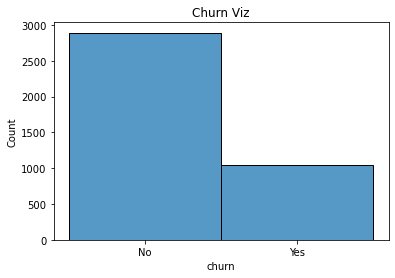

In [53]:
plt.title('Churn Viz')
sns.histplot(train.churn)
plt.show();

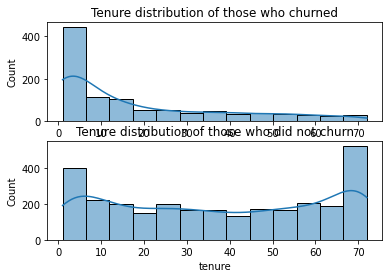

In [54]:
plt.subplot(211)
plt.title('Tenure distribution of those who churned')
sns.histplot(train[train['churn'] == 'Yes'].tenure, kde = True)

plt.subplot(212)
plt.title('Tenure distribution of those who did not churn')
sns.histplot(train[train['churn'] == 'No'].tenure, kde = True)
plt.show();

It appears the tenure of those who have churned is concentrated on those with low tenure

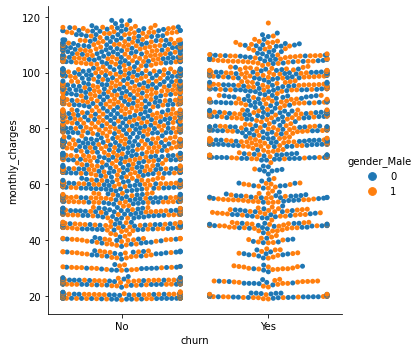

In [55]:
sns.catplot(x = 'churn', y = 'monthly_charges', hue = 'gender_Male', kind = 'swarm', data = train)

There is a concentration of those who churned in the monthly charge range of $70 to $110

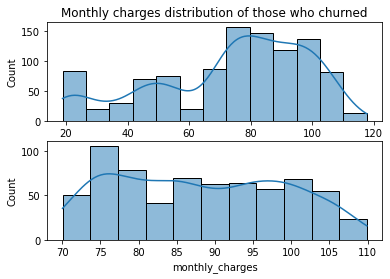

In [56]:
plt.subplot(211)
plt.title('Monthly charges distribution of those who churned')
sns.histplot(train[train['churn'] == 'Yes'].monthly_charges, kde = True)

plt.subplot(212)
sns.histplot(train[train['churn'] == 'Yes'][train['monthly_charges'] > 70][train['monthly_charges'] < 110].monthly_charges, kde = True)
plt.show();

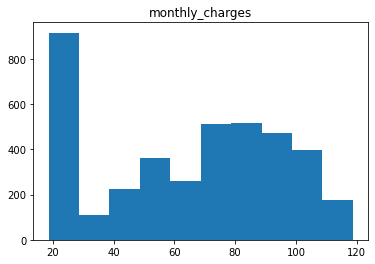

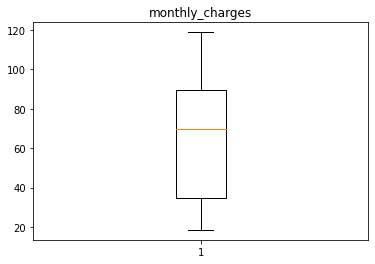

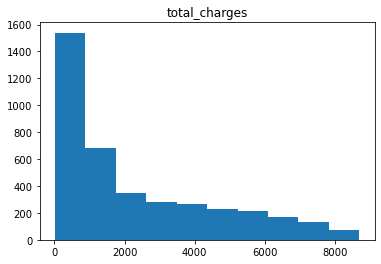

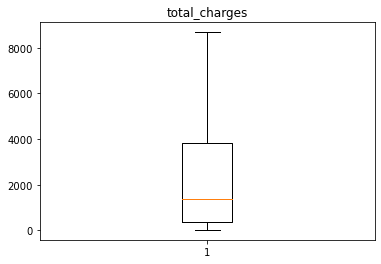

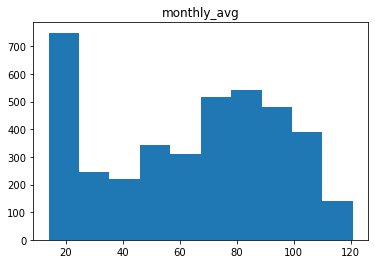

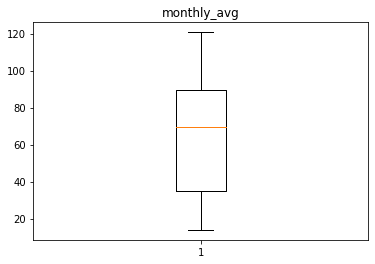

In [473]:
f_quantitatives = train.columns[[train[col].dtype == 'float64' for col in train.columns]]
for col in f_quantitatives:
    plt.hist(train[col])
    plt.title(col)
    plt.show()
    plt.boxplot(train[col])
    plt.title(col)
    plt.show();

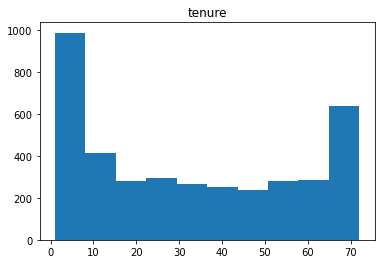

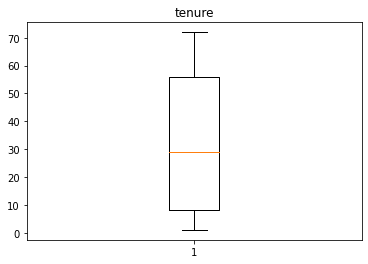

In [58]:
i_quantitatives = train.columns[[train[col].dtype == 'int64' for col in train.columns]]
for col in i_quantitatives:
    plt.hist(train[col])
    plt.title(col)
    plt.show()
    plt.boxplot(train[col])
    plt.title(col)
    plt.show();

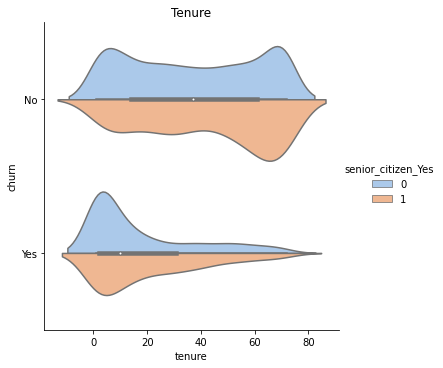

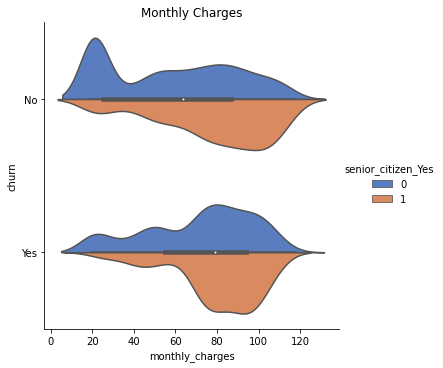

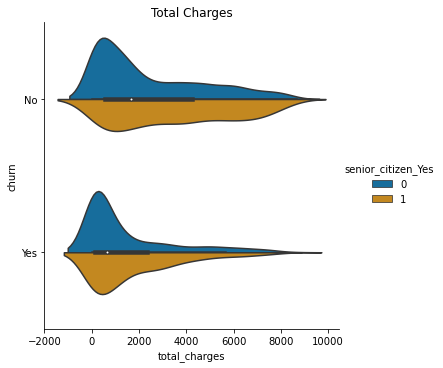

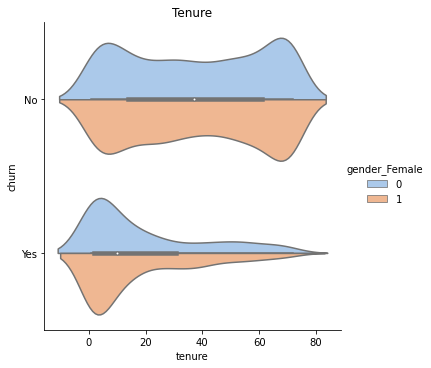

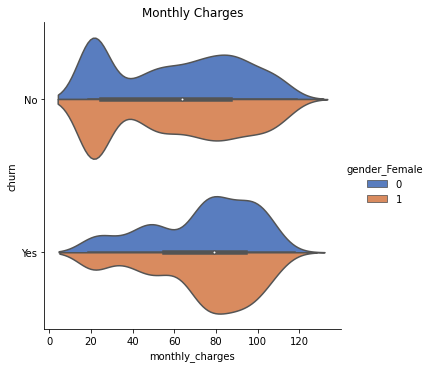

...

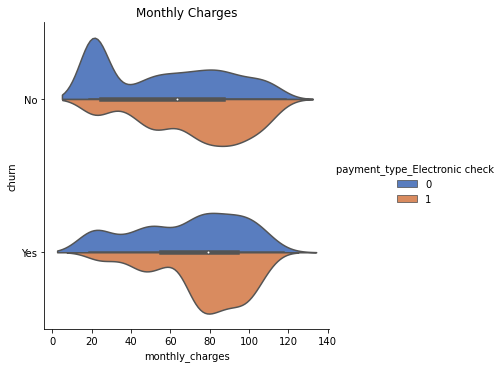

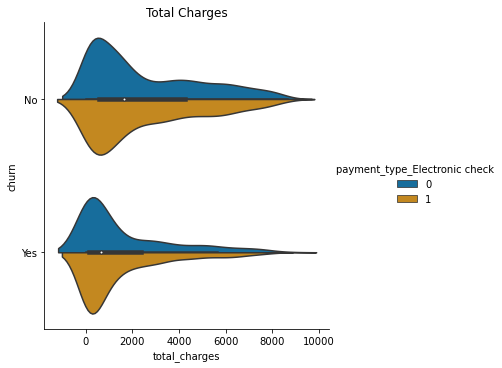

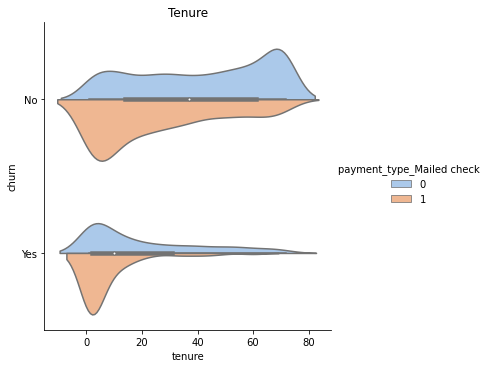

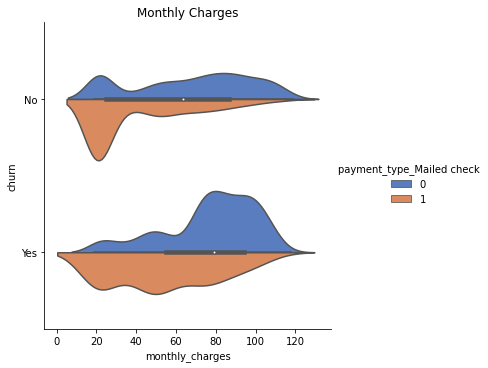

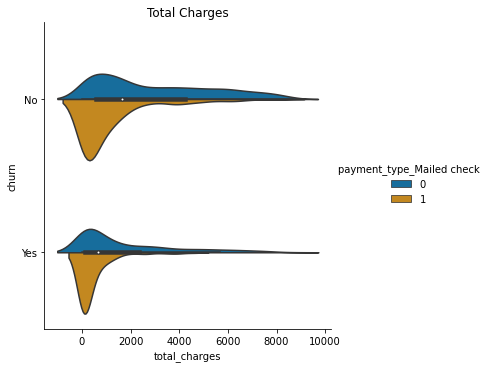

In [76]:
u_quantitatives = train.columns[[train[col].dtype == 'uint8' for col in train.columns]]
for col in u_quantitatives:
    sns.catplot(y = 'churn', x = 'tenure', hue = col, kind = 'violin', data = train, split = True, palette = 'pastel')
    plt.title('Tenure')
    plt.show()
    sns.catplot(y = 'churn', x = 'monthly_charges', hue = col, kind = 'violin', data = train, split = True, palette = 'muted')
    plt.title('Monthly Charges')
    plt.show()
    sns.catplot(y = 'churn', x = 'total_charges', hue = col, kind = 'violin', data = train, split = True, palette = 'colorblind')
    plt.title('Total Charges')
    plt.show();

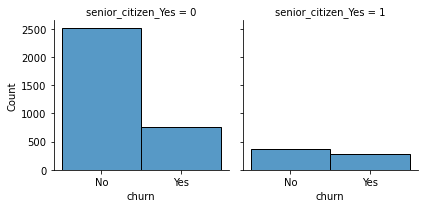

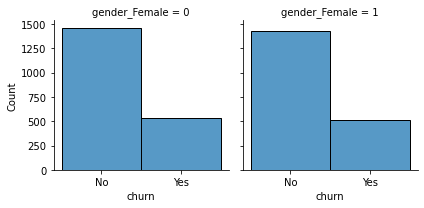

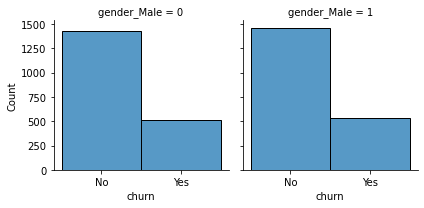

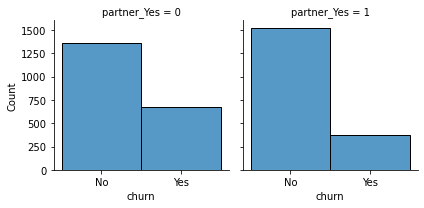

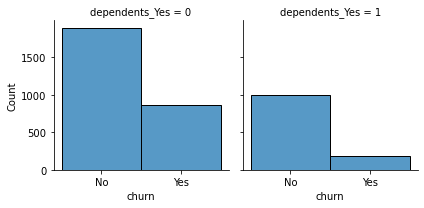

...

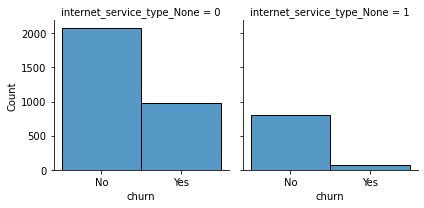

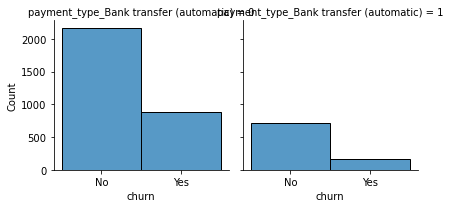

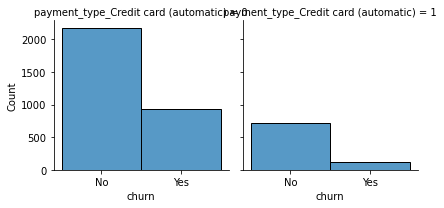

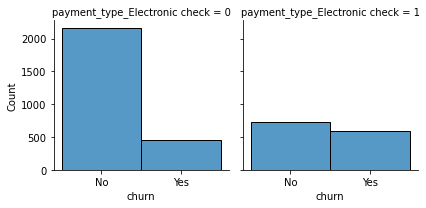

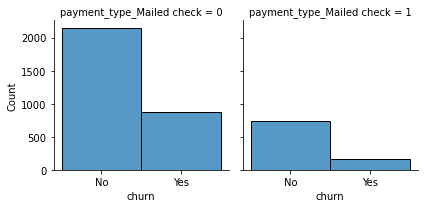

In [474]:
for column in u_quantitatives:
    sns.FacetGrid(train, col = column).map(sns.histplot, 'churn')
    plt.show();

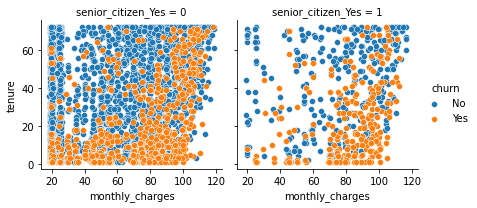

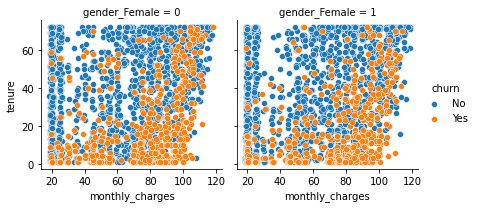

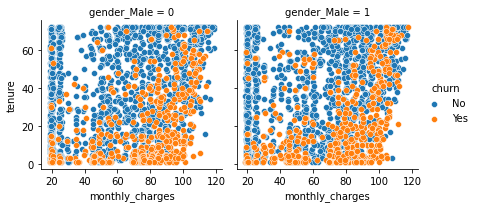

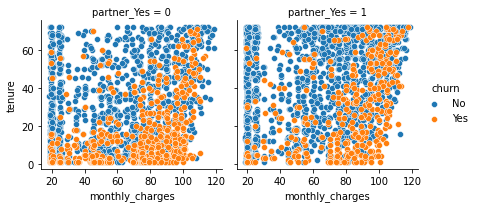

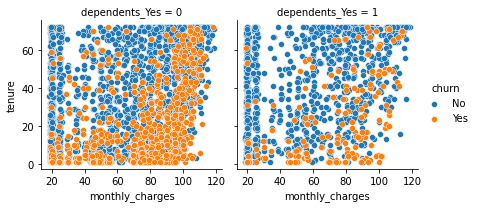

...

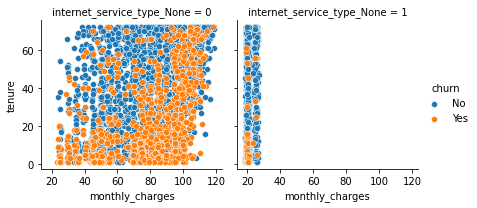

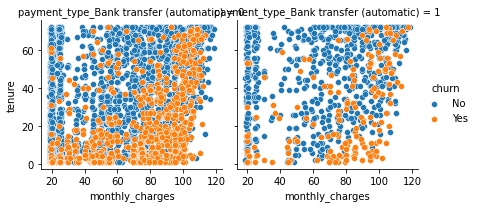

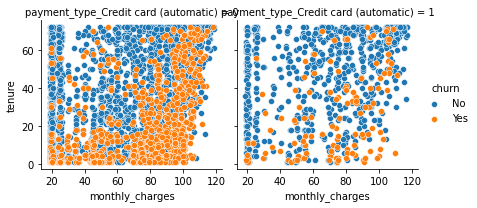

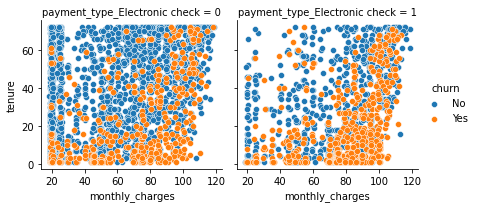

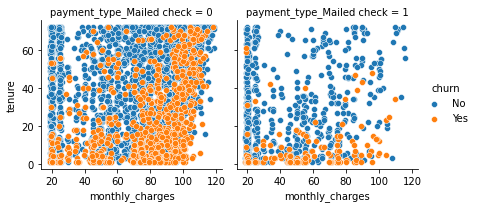

In [95]:
for column in u_quantitatives:
    sns.FacetGrid(train, col = column, hue = 'churn').map(sns.scatterplot, 'monthly_charges', 'tenure').add_legend()

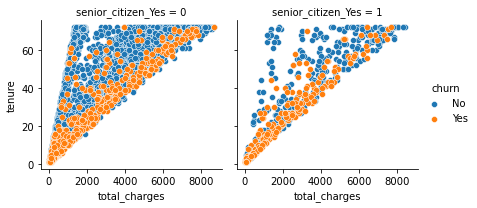

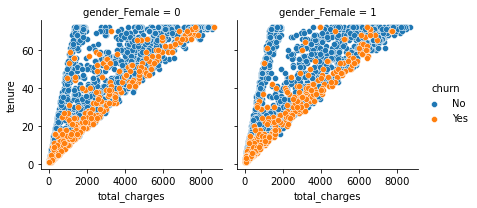

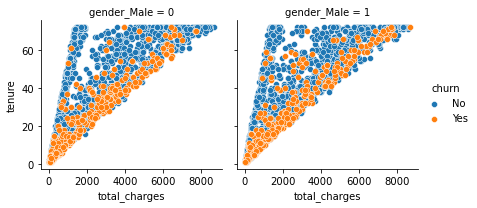

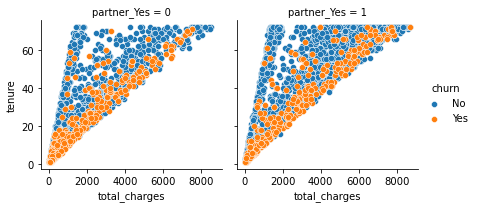

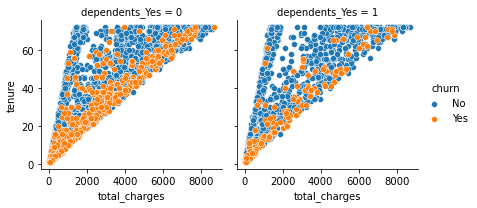

...

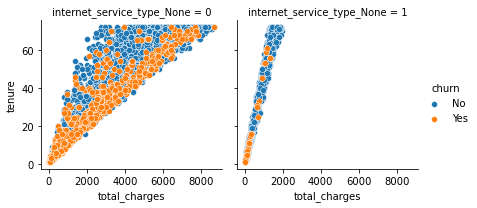

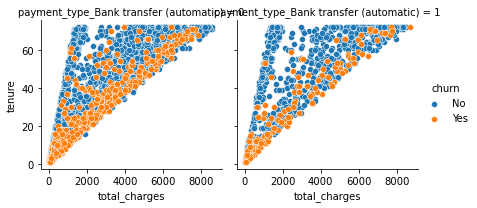

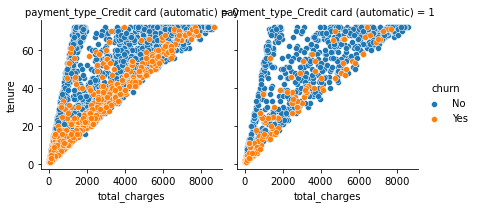

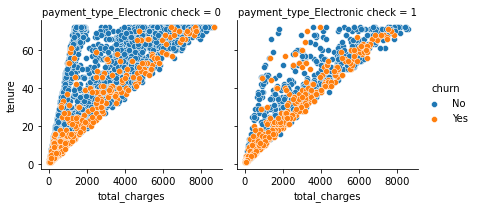

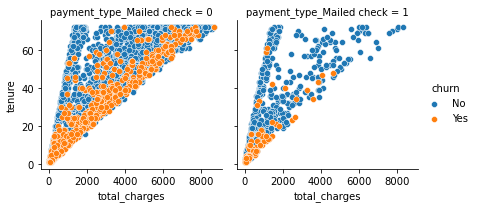

In [101]:
for column in u_quantitatives:
    sns.FacetGrid(train, col = column, hue = 'churn').map(sns.scatterplot, 'total_charges', 'tenure').add_legend()

In [85]:
i_quantitatives

Index(['tenure'], dtype='object')

In [86]:
f_quantitatives

Index(['monthly_charges', 'total_charges'], dtype='object')

In [87]:
u_quantitatives

Index(['senior_citizen_Yes', 'gender_Female', 'gender_Male', 'partner_Yes',
       'dependents_Yes', 'phone_service_Yes', 'multiple_lines_Yes',
       'online_security_Yes', 'online_backup_Yes', 'device_protection_Yes',
       'tech_support_Yes', 'streaming_tv_Yes', 'streaming_movies_Yes',
       'paperless_billing_Yes', 'contract_type_Month-to-month',
       'contract_type_One year', 'contract_type_Two year',
       'internet_service_type_DSL', 'internet_service_type_Fiber optic',
       'internet_service_type_None', 'payment_type_Bank transfer (automatic)',
       'payment_type_Credit card (automatic)', 'payment_type_Electronic check',
       'payment_type_Mailed check'],
      dtype='object')

In [88]:
train.columns

Index(['senior_citizen_Yes', 'tenure', 'monthly_charges', 'total_charges',
       'churn', 'gender_Female', 'gender_Male', 'partner_Yes',
       'dependents_Yes', 'phone_service_Yes', 'multiple_lines_Yes',
       'online_security_Yes', 'online_backup_Yes', 'device_protection_Yes',
       'tech_support_Yes', 'streaming_tv_Yes', 'streaming_movies_Yes',
       'paperless_billing_Yes', 'contract_type_Month-to-month',
       'contract_type_One year', 'contract_type_Two year',
       'internet_service_type_DSL', 'internet_service_type_Fiber optic',
       'internet_service_type_None', 'payment_type_Bank transfer (automatic)',
       'payment_type_Credit card (automatic)', 'payment_type_Electronic check',
       'payment_type_Mailed check'],
      dtype='object')

In [89]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3937 entries, 6096 to 3935
Data columns (total 28 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   senior_citizen_Yes                      3937 non-null   uint8  
 1   tenure                                  3937 non-null   int64  
 2   monthly_charges                         3937 non-null   float64
 3   total_charges                           3937 non-null   float64
 4   churn                                   3937 non-null   object 
 5   gender_Female                           3937 non-null   uint8  
 6   gender_Male                             3937 non-null   uint8  
 7   partner_Yes                             3937 non-null   uint8  
 8   dependents_Yes                          3937 non-null   uint8  
 9   phone_service_Yes                       3937 non-null   uint8  
 10  multiple_lines_Yes                      3937 non-null   u

In [80]:
train.corr().T

,senior_citizen_Yes,tenure,monthly_charges,total_charges,gender_Female,gender_Male,partner_Yes,dependents_Yes,phone_service_Yes,multiple_lines_Yes,...,contract_type_Month-to-month,contract_type_One year,contract_type_Two year,internet_service_type_DSL,internet_service_type_Fiber optic,internet_service_type_None,payment_type_Bank transfer (automatic),payment_type_Credit card (automatic),payment_type_Electronic check,payment_type_Mailed check
senior_citizen_Yes,1.000000,0.016071,0.220475,0.094484,0.001378,-0.001378,0.019339,-0.212460,0.004428,0.140615,...,0.137764,-0.049404,-0.112439,-0.090417,0.246278,-0.190126,-0.009994,-0.031969,0.179688,-0.160416
tenure,0.016071,1.000000,0.260740,0.827061,-0.007683,0.007683,0.390546,0.169495,-0.000353,0.330175,...,-0.653514,0.201373,0.564580,0.019816,0.023672,-0.050976,0.247613,0.231383,-0.205568,-0.240697
monthly_charges,0.220475,0.260740,1.000000,0.659592,0.009844,-0.009844,0.087960,-0.107817,0.242779,0.491332,...,0.048279,-0.003999,-0.051999,-0.155841,0.788198,-0.761674,0.043696,0.037876,0.266628,-0.379150
total_charges,0.094484,0.827061,0.659592,1.000000,-0.000279,0.000279,0.313955,0.065545,0.109057,0.463428,...,-0.452815,0.160613,0.371249,-0.049454,0.365036,-0.378817,0.185719,0.188309,-0.061325,-0.298972
gender_Female,0.001378,-0.007683,0.009844,-0.000279,1.000000,-1.000000,0.001221,0.001645,0.027566,0.004093,...,-0.009518,-0.009887,0.020350,-0.014255,0.006615,0.008460,0.021951,-0.002367,-0.008996,-0.009446
gender_Male,-0.001378,0.007683,-0.009844,0.000279,-1.000000,1.000000,-0.001221,-0.001645,-0.027566,-0.004093,...,0.009518,0.009887,-0.020350,0.014255,-0.006615,-0.008460,-0.021951,0.002367,0.008996,0.009446
partner_Yes,0.019339,0.390546,0.087960,0.313955,0.001221,-0.001221,1.000000,0.456445,0.003623,0.128751,...,-0.297412,0.089218,0.259233,0.003642,-0.010449,0.008290,0.099761,0.091631,-0.081989,-0.096361
dependents_Yes,-0.212460,0.169495,-0.107817,0.065545,0.001645,-0.001645,0.456445,1.000000,0.001674,-0.026156,...,-0.237558,0.073126,0.205300,0.044804,-0.158009,0.137133,0.061272,0.080892,-0.166867,0.047500
phone_service_Yes,0.004428,-0.000353,0.242779,0.109057,0.027566,-0.027566,0.003623,0.001674,1.000000,0.280078,...,-0.000083,-0.016676,0.015870,-0.453756,0.288353,0.176484,0.026137,-0.011657,-0.011677,-0.001575
multiple_lines_Yes,0.140615,0.330175,0.491332,0.463428,0.004093,-0.004093,0.128751,-0.026156,0.280078,1.000000,...,-0.094549,-0.010314,0.118998,-0.218045,0.374260,-0.196419,0.087754,0.046854,0.088780,-0.232329


In [ ]:
i_quantitatives, f_quantitatives

In [132]:
print('Customers who did churn')
print('The variance of the tenure column is: {}'.format(train['tenure'][train['churn'] == 'Yes'].var()))
print('The variance of the monthly charges column is: {}'.format(train['monthly_charges'][train['churn'] == 'Yes'].var()))
print('The variance of the total charges column is: {}'.format(train['total_charges'][train['churn'] == 'Yes'].var()))
print('Customers who did not churn')
print('The variance of the tenure column is: {}'.format(train['tenure'][train['churn'] == 'No'].var()))
print('The variance of the monthly charges column is: {}'.format(train['monthly_charges'][train['churn'] == 'No'].var()))
print('The variance of the total charges column is: {}'.format(train['total_charges'][train['churn'] == 'No'].var()))

Customers who did churn
The variance of the tenure column is: 403.5336263917232
The variance of the monthly charges column is: 619.2429937149499
The variance of the total charges column is: 3715096.1457623923
Customers who did not churn
The variance of the tenure column is: 592.8749398862236
The variance of the monthly charges column is: 968.2139164499304
The variance of the total charges column is: 5516809.954525333


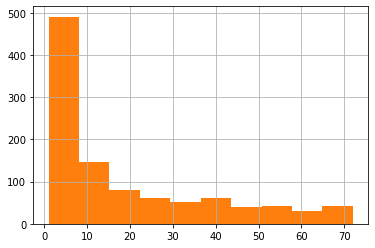

In [118]:
train['tenure'][train.churn == 'Yes'].hist();

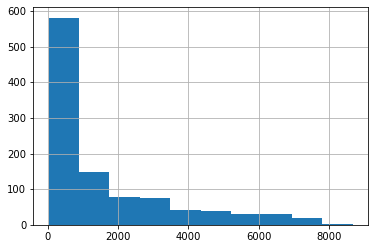

In [119]:
train['total_charges'][train.churn == 'Yes'].hist();

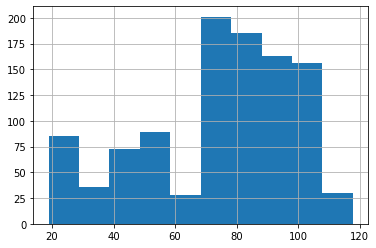

In [120]:
train['monthly_charges'][train.churn == 'Yes'].hist();

H0: Mean of monthly charges of customers who churn = Mean of monthly charges of all customers

Ha: Mean of monthly charges of customers who churn > Mean of monthly charges of all customers

In [121]:
alpha = 0.05
t, p = stats.ttest_1samp(train['monthly_charges'][train.churn == 'Yes'], train.monthly_charges.mean())
print(t, p/2, alpha)

12.309733081592267 6.462795705617355e-33 0.05


In [123]:
if p/2 > alpha:
    print('We fail to reject H0')
elif t < 0:
    print('We fail to reject H0')
else:
    print('We reject H0')

We reject H0


In [124]:
train['monthly_charges'][train.churn == 'Yes'].mean(), train.monthly_charges.mean()

(73.66242829827921, 64.19104648209276)

H0: Mean of total charges of customers who churn = Mean of total charges of all customers
    
Ha: Mean of total charges of customers who churn > Mean of total charges of all customers

In [134]:
alpha = 0.05
t, p = stats.ttest_1samp(train['total_charges'][train.churn == 'Yes'], train.total_charges.mean())
print(t, p/2, alpha)

-12.317198587388003 5.961140356498386e-33 0.05


In [126]:
if p/2 > alpha:
    print('We fail to reject H0')
elif t < 0:
    print('We fail to reject H0')
else:
    print('We reject H0')

We fail to reject H0


In [127]:
train['total_charges'][train.churn == 'Yes'].mean(), train.total_charges.mean()

(1547.4283938814517, 2281.48766827534)

H0: Mean of monthly charges of customers who churn = Mean of monthly charges of all customers

Ha: Mean of monthly charges of customers who churn != Mean of monthly charges of all customers

In [149]:
alpha = 0.05
t, p = stats.ttest_ind(train['monthly_charges'][train.churn == 'Yes'], train['monthly_charges'][train.churn == 'No'], equal_var = False)
print(t, p, alpha)

13.397084738649387 1.8328650403299517e-39 0.05


In [150]:
if p > alpha:
    print('We fail to reject H0')
else:
    print('We reject H0')

We reject H0


In [156]:
train['monthly_charges'][train.churn == 'Yes'].mean(), train['monthly_charges'][train.churn == 'No'].mean()

(73.66242829827921, 60.76418194396395)

H0: Mean of total charges of customers who churn = Mean of total charges of all customers

Ha: Mean of total charges of customers who churn != Mean of total charges of all customers

In [152]:
alpha = 0.05
t, p = stats.ttest_ind(train['total_charges'][train.churn == 'Yes'], train['total_charges'][train.churn == 'No'], equal_var = False)
print(t, p, alpha)

-13.528592754547978 3.84825696330086e-40 0.05


In [153]:
if p > alpha:
    print('We fail to reject H0')
else:
    print('We reject H0')

We reject H0


In [155]:
train['total_charges'][train.churn == 'Yes'].mean(), train['total_charges'][train.churn == 'No'].mean()

(1547.4283938814517, 2547.0795053614697)

In [237]:
# function for categorizing data into object types (quantitatives) and numeric (qualitatives)
def telco_qqvars():
    df = telco_data()
    df.drop_duplicates(inplace = True)
    df.senior_citizen = df.senior_citizen.replace({0:'No', 1:'Yes'})
    df = df.replace(r'^\s*$', np.nan, regex = True)
    df.total_charges = df.total_charges.astype('float64')
    df.replace(to_replace = {'No phone service':'No', 'No internet service':'No'}, inplace = True)
    df_before_split = df.drop(columns = ['payment_type_id', 'internet_service_type_id', 'contract_type_id', 'customer_id'])
    df_qualitative = df_before_split.select_dtypes(include = 'object')
    df_quantitative = df_before_split.select_dtypes(exclude = 'object')
    return df_before_split, df_qualitative, df_quantitative

In [238]:
df_bsplit, qualitative, quantitative = telco_qqvars()

In [205]:
qualitative.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 17 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   gender                 7043 non-null   object
 1   senior_citizen         7043 non-null   object
 2   partner                7043 non-null   object
 3   dependents             7043 non-null   object
 4   phone_service          7043 non-null   object
 5   multiple_lines         7043 non-null   object
 6   online_security        7043 non-null   object
 7   online_backup          7043 non-null   object
 8   device_protection      7043 non-null   object
 9   tech_support           7043 non-null   object
 10  streaming_tv           7043 non-null   object
 11  streaming_movies       7043 non-null   object
 12  paperless_billing      7043 non-null   object
 13  churn                  7043 non-null   object
 14  contract_type          7043 non-null   object
 15  internet_service_type

In [302]:
# don't forget to add a monthly average column!!
df_bsplit['monthly_avg'] = df_bsplit['total_charges']/df_bsplit['tenure']
df_bsplit['monthly_avg']

0       91.660000
1       45.565741
2       45.716071
3       41.270000
4       87.725000
          ...    
7038    20.050000
7039    19.344737
7040    21.591667
7041    18.900000
7042    21.375000
Name: monthly_avg, Length: 7043, dtype: float64

In [304]:
quantitative['monthly_avg'] = df_bsplit['monthly_avg']

In [305]:
quantitative.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   tenure           7043 non-null   int64  
 1   monthly_charges  7043 non-null   float64
 2   total_charges    7032 non-null   float64
 3   monthly_avg      7032 non-null   float64
dtypes: float64(3), int64(1)
memory usage: 275.1 KB


In [310]:
quantitative.describe()

,tenure,monthly_charges,total_charges,monthly_avg
count,7043.000000,7043.000000,7032.000000,7032.000000
mean,32.371149,64.761692,2283.300441,64.799424
std,24.559481,30.090047,2266.771362,30.185891
min,0.000000,18.250000,18.800000,13.775000
25%,9.000000,35.500000,401.450000,36.179891
50%,29.000000,70.350000,1397.475000,70.373239
75%,55.000000,89.850000,3794.737500,90.179560
max,72.000000,118.750000,8684.800000,121.400000


In [ ]:
# consider dropping total charges and monthly avg?
# the thinking is that monthly avg is too close to monthly charges and total charges may be
# irrelevant if customers don't take too long to churn

In [182]:
#df_test = telco_data()
df_test.senior_citizen = df_test.senior_citizen.replace({0:'No', 1:'Yes'})
df_test.head(3)

,payment_type_id,internet_service_type_id,contract_type_id,customer_id,gender,senior_citizen,partner,dependents,tenure,phone_service,...,tech_support,streaming_tv,streaming_movies,paperless_billing,monthly_charges,total_charges,churn,contract_type,internet_service_type,payment_type
0,2,1,3,0016-QLJIS,Female,No,Yes,Yes,65,Yes,...,Yes,Yes,Yes,Yes,90.45,5957.9,No,Two year,DSL,Mailed check
1,4,1,3,0017-DINOC,Male,No,No,No,54,No,...,Yes,Yes,No,No,45.20,2460.55,No,Two year,DSL,Credit card (automatic)
2,3,1,3,0019-GFNTW,Female,No,No,No,56,No,...,Yes,No,No,No,45.05,2560.1,No,Two year,DSL,Bank transfer (automatic)


In [183]:
df_obj = df_test.select_dtypes(include = 'object')
#df_obj = df_obj.drop(columns = ['customer_id', 'total_charges', 'churn'])
df_obj.head(3)

,gender,senior_citizen,partner,dependents,phone_service,multiple_lines,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,paperless_billing,contract_type,internet_service_type,payment_type
0,Female,No,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Two year,DSL,Mailed check
1,Male,No,No,No,No,No phone service,Yes,No,No,Yes,Yes,No,No,Two year,DSL,Credit card (automatic)
2,Female,No,No,No,No,No phone service,Yes,Yes,Yes,Yes,No,No,No,Two year,DSL,Bank transfer (automatic)


In [185]:
df_obj_cols = df_obj.columns
df_obj_cols

Index(['gender', 'senior_citizen', 'partner', 'dependents', 'phone_service',
       'multiple_lines', 'online_security', 'online_backup',
       'device_protection', 'tech_support', 'streaming_tv', 'streaming_movies',
       'paperless_billing', 'contract_type', 'internet_service_type',
       'payment_type'],
      dtype='object')

In [207]:
qltrain, qlvalidate, qltest = train_validate_test_split(qualitative, seed = 123)

In [475]:
qltrain.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3943 entries, 5642 to 6840
Data columns (total 17 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   gender                 3943 non-null   object
 1   senior_citizen         3943 non-null   object
 2   partner                3943 non-null   object
 3   dependents             3943 non-null   object
 4   phone_service          3943 non-null   object
 5   multiple_lines         3943 non-null   object
 6   online_security        3943 non-null   object
 7   online_backup          3943 non-null   object
 8   device_protection      3943 non-null   object
 9   tech_support           3943 non-null   object
 10  streaming_tv           3943 non-null   object
 11  streaming_movies       3943 non-null   object
 12  paperless_billing      3943 non-null   object
 13  churn                  3943 non-null   object
 14  contract_type          3943 non-null   object
 15  internet_service_t

In [208]:
for col in qltrain:
    observed = pd.crosstab(qltrain[col], qltrain['churn'])
    chi2, p, degf, expected = stats.chi2_contingency(observed)
    chi2_summary = pd.DataFrame({'chi2': [chi2], 'p': [p], 'degrees of freedom': [degf]})
    expected = pd.DataFrame(expected)
    print('observed')
    print(observed)
    print('')
    print(chi2_summary)
    print('')
    print('expected')
    print(expected)
    print('')
    print('----------------------------------------------')
    print('')

observed
churn     No  Yes
gender           
Female  1424  506
Male    1473  540

       chi2        p  degrees of freedom
0  0.156993  0.69194                   1

expected
            0          1
0  1418.00913  511.99087
1  1478.99087  534.00913

----------------------------------------------

observed
churn             No  Yes
senior_citizen           
No              2533  770
Yes              364  276

         chi2             p  degrees of freedom
0  106.962416  4.536923e-25                   1

expected
             0           1
0  2426.779356  876.220644
1   470.220644  169.779356

----------------------------------------------

observed
churn      No  Yes
partner           
No       1382  662
Yes      1515  384

        chi2             p  degrees of freedom
0  74.137206  7.287185e-18                   1

expected
             0           1
0  1501.767182  542.232818
1  1395.232818  503.767182

----------------------------------------------

observed
churn         No  Yes
d

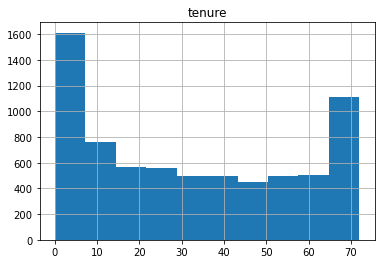

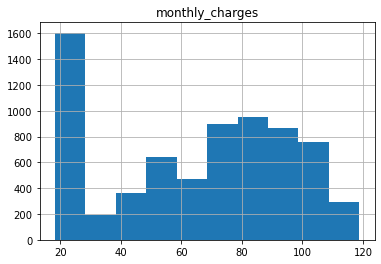

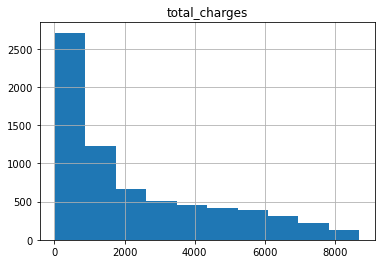

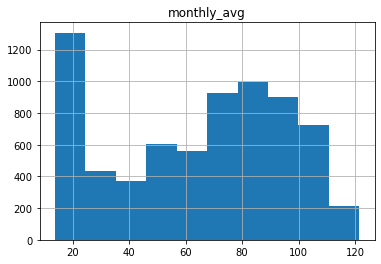

In [306]:
for col in quantitative:
    plt.title(col)
    quantitative[col].hist()
    plt.show();

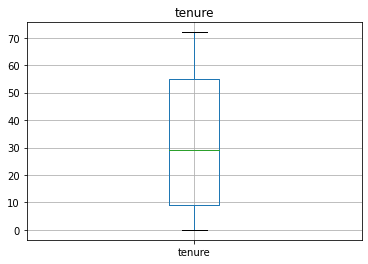

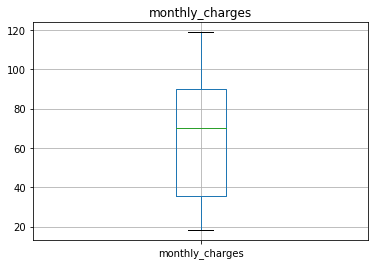

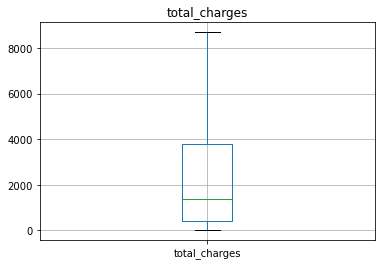

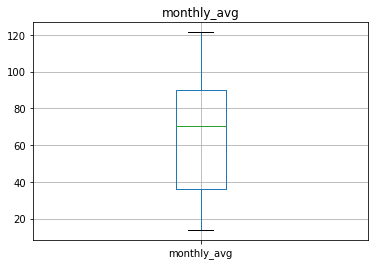

In [307]:
for col in quantitative:
    plt.title(col)
    quantitative.boxplot(column = col)
    plt.show();

<AxesSubplot:>

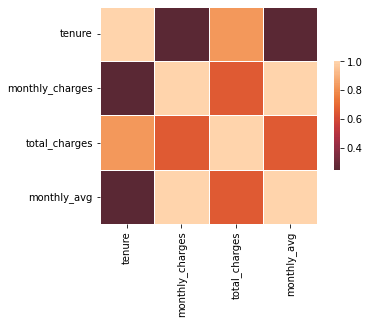

In [308]:
sns.heatmap(quantitative.corr(), center = 0, square = True, linewidths = .5, cbar_kws = {'shrink': .5})

In [229]:
for col in quantitative:
    print(col)
    print(quantitative[col].describe())
    print('----------------------------------')

tenure
count    7043.000000
mean       32.371149
std        24.559481
min         0.000000
25%         9.000000
50%        29.000000
75%        55.000000
max        72.000000
Name: tenure, dtype: float64
----------------------------------
monthly_charges
count    7043.000000
mean       64.761692
std        30.090047
min        18.250000
25%        35.500000
50%        70.350000
75%        89.850000
max       118.750000
Name: monthly_charges, dtype: float64
----------------------------------
total_charges
count    7032.000000
mean     2283.300441
std      2266.771362
min        18.800000
25%       401.450000
50%      1397.475000
75%      3794.737500
max      8684.800000
Name: total_charges, dtype: float64
----------------------------------


In [282]:
df_bsplit.head(3)

,gender,senior_citizen,partner,dependents,tenure,phone_service,multiple_lines,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,paperless_billing,monthly_charges,total_charges,churn,contract_type,internet_service_type,payment_type
0,Female,No,Yes,Yes,65,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,90.45,5957.90,No,Two year,DSL,Mailed check
1,Male,No,No,No,54,No,No,Yes,No,No,Yes,Yes,No,No,45.20,2460.55,No,Two year,DSL,Credit card (automatic)
2,Female,No,No,No,56,No,No,Yes,Yes,Yes,Yes,No,No,No,45.05,2560.10,No,Two year,DSL,Bank transfer (automatic)


In [276]:
qualitative.describe().T

,count,unique,top,freq
gender,7043,2,Male,3555
senior_citizen,7043,2,No,5901
partner,7043,2,No,3641
dependents,7043,2,No,4933
phone_service,7043,2,Yes,6361
multiple_lines,7043,2,No,4072
online_security,7043,2,No,5024
online_backup,7043,2,No,4614
device_protection,7043,2,No,4621
tech_support,7043,2,No,4999


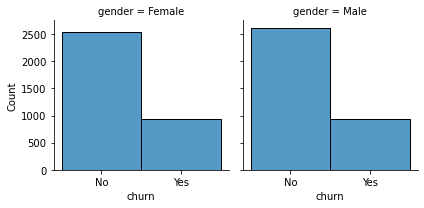

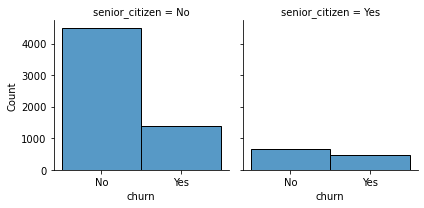

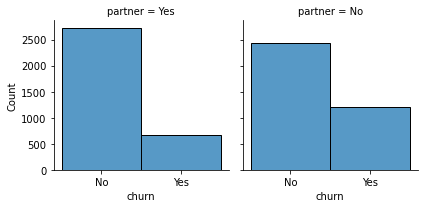

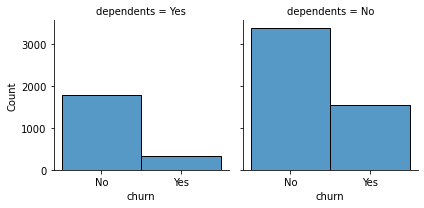

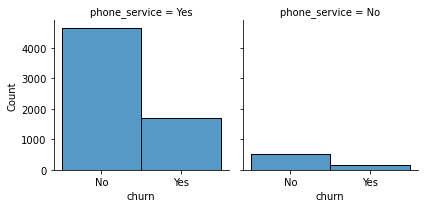

...

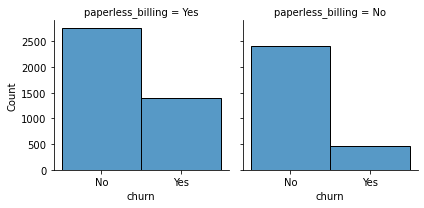

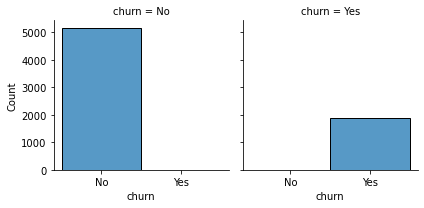

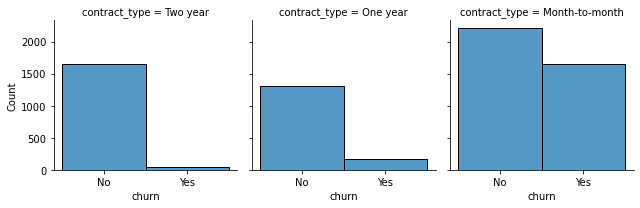

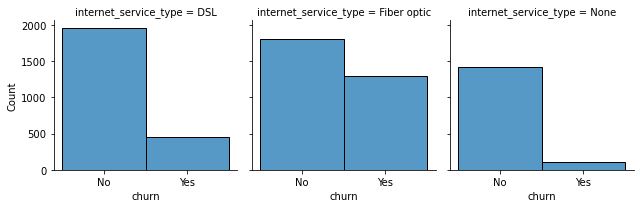

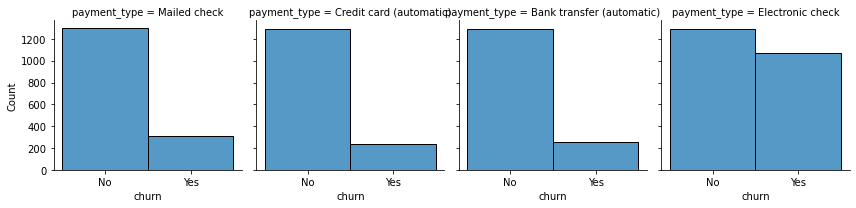

In [283]:
for column in qualitative:
    sns.FacetGrid(df_bsplit, col = column).map(sns.histplot, 'churn')
    plt.show();

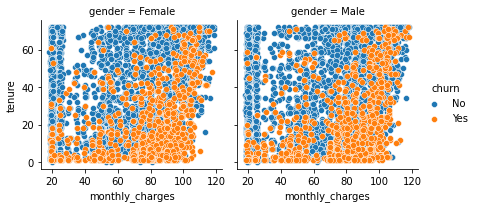

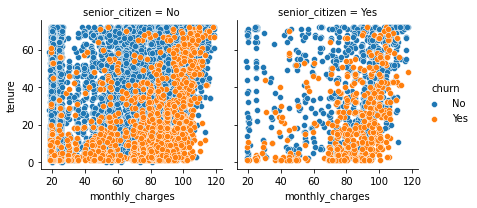

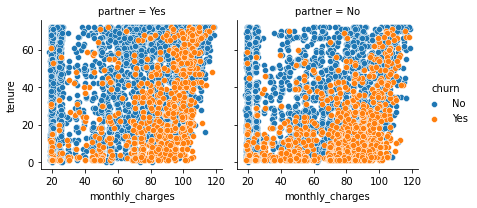

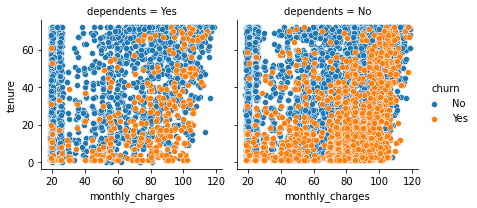

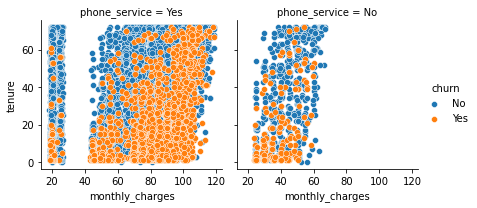

...

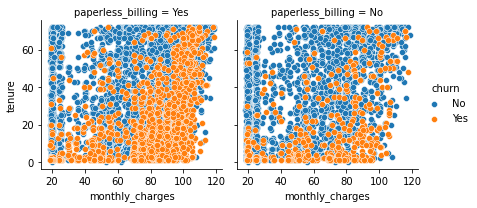

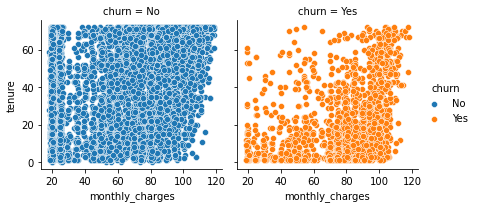

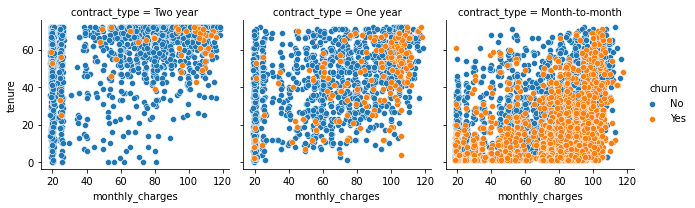

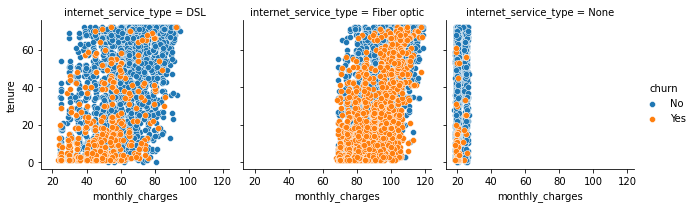

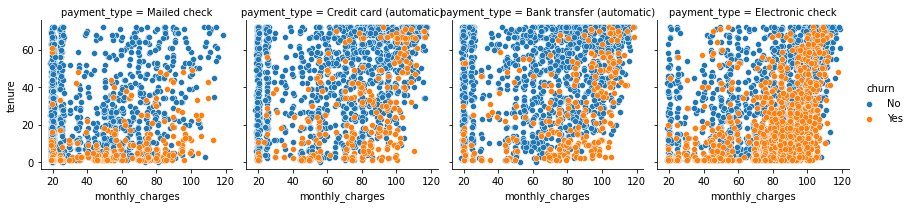

In [241]:
for column in qualitative:
    sns.FacetGrid(df_bsplit, col = column, hue = 'churn').map(sns.scatterplot, 'monthly_charges', 'tenure').add_legend()

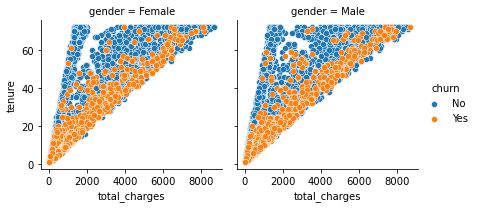

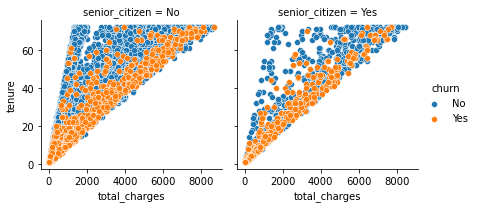

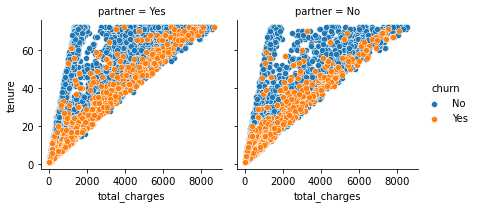

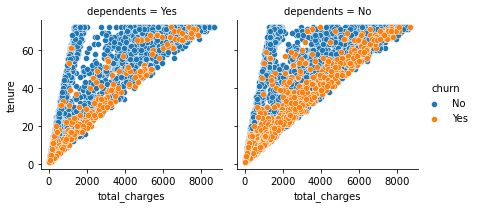

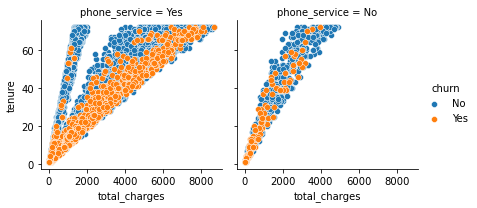

...

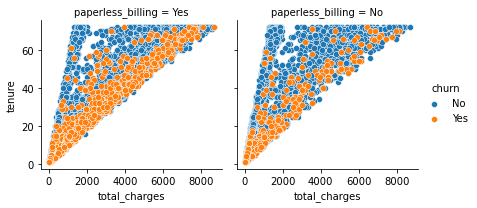

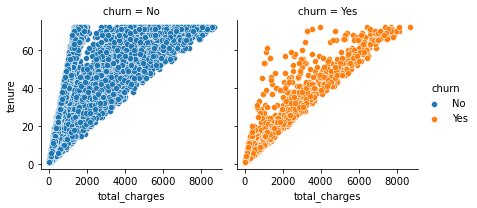

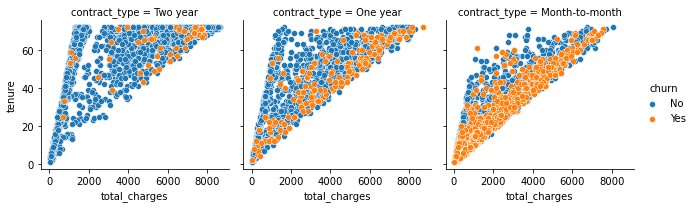

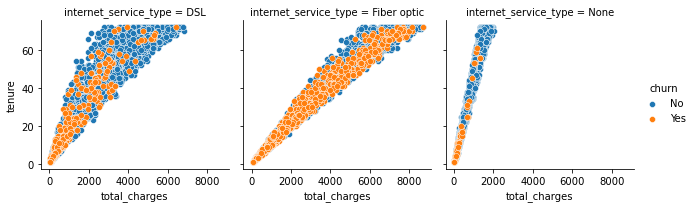

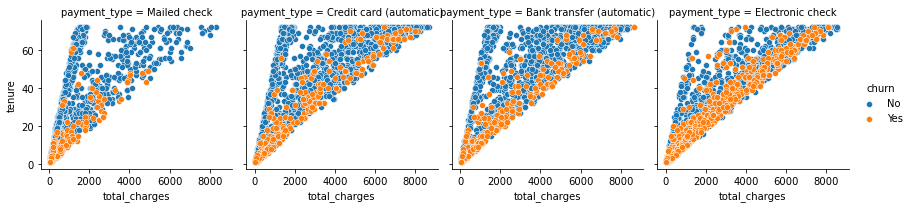

In [244]:
for column in qualitative:
    sns.FacetGrid(df_bsplit, col = column, hue = 'churn').map(sns.scatterplot, 'total_charges', 'tenure').add_legend()

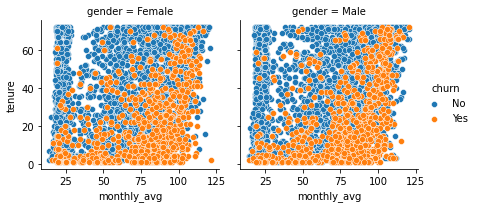

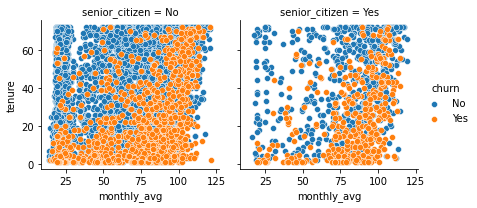

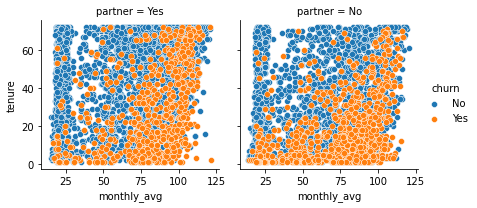

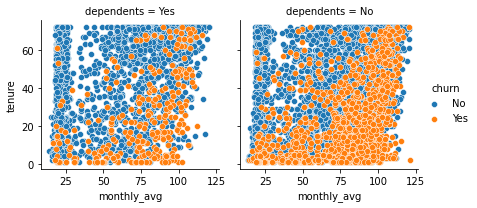

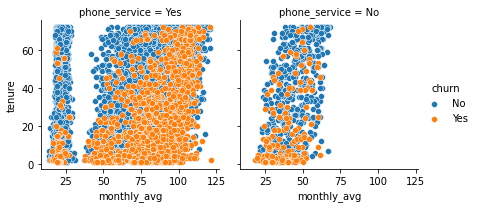

...

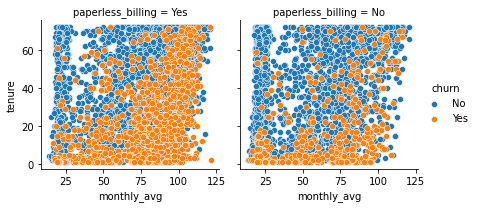

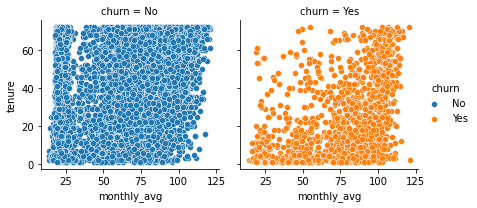

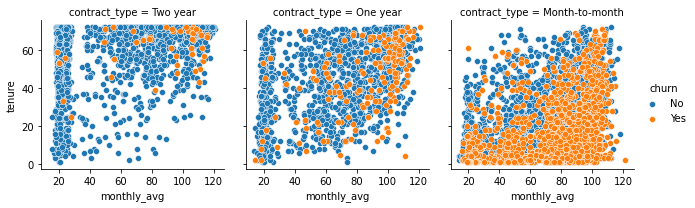

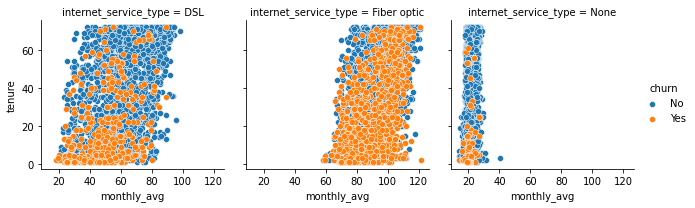

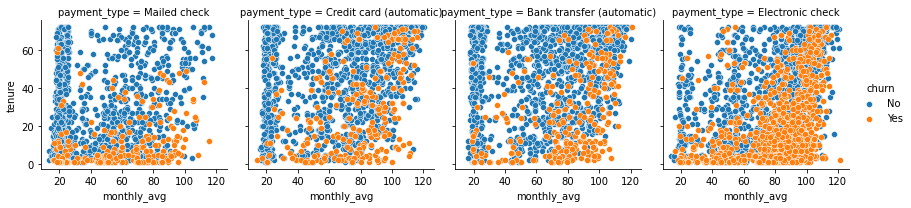

In [303]:
for column in qualitative:
    sns.FacetGrid(df_bsplit, col = column, hue = 'churn').map(sns.scatterplot, 'monthly_avg', 'tenure').add_legend()

In [331]:
for i in qualitative:
    print('Churn = Yes')
    print(pd.pivot_table(df_bsplit[df_bsplit['churn'] == 'Yes'], index = i, values = 'monthly_charges'))
    print('Churn = No')
    print(pd.pivot_table(df_bsplit[df_bsplit['churn'] == 'No'], index = i, values = 'monthly_charges'))
    print('')
    print('-----------------------------------------------')
    print('')

Churn = Yes
        monthly_charges
gender                 
Female        74.812087
Male          74.066989
Churn = No
        monthly_charges
gender                 
Female        61.664908
Male          60.876914

-----------------------------------------------

Churn = Yes
                monthly_charges
senior_citizen                 
No                    72.298098
Yes                   80.713445
Churn = No
                monthly_charges
senior_citizen                 
No                    58.618123
Yes                   79.182057

-----------------------------------------------

Churn = Yes
         monthly_charges
partner                 
No             71.450958
Yes            79.805232
Churn = No
         monthly_charges
partner                 
No             57.271856
Yes            64.831742

-----------------------------------------------

Churn = Yes
            monthly_charges
dependents                 
No                74.774141
Yes               72.866104
Churn = N

In [251]:
df['baseline_pred'] = 'No'

In [252]:
baseline_accuracy = (df.baseline_pred == df.churn).mean()

print(f'baseline accuracy: {baseline_accuracy:.2%}')

baseline accuracy: 73.42%


In [342]:
def clean_telco(df):
    '''
    This functions takes in the telco_db combined into a single dataframe as an argument,
    drops duplicate values and columns, replaces values 'No phone service' and 'No internet 
    service' to 'No', updates the data type of the total_charges column, transforms object 
    type columns, minus curn, into dummies and drops parent dummy columns. Since drop_first is
    set to false, dummy no columns are dropped and senior citizen is renamed and changed its
    type for consistency purposes. Finally, the function drops 12 rows of data from missing 
    values in the total_charges column.
    '''
    df.drop_duplicates(inplace = True)
    df.replace(to_replace = {'No phone service':'No', 'No internet service':'No'}, inplace = True)
    dropped_columns = ['payment_type_id', 'internet_service_type_id', 'contract_type_id',
       'customer_id']
    df_dropped = df.drop(columns = dropped_columns)
    df_dropped = df_dropped.replace(r'^\s*$', np.nan, regex = True)
    df_dropped.total_charges = df_dropped.total_charges.astype('float64')
    obj_cols_name = df_dropped.columns[[df_dropped[col].dtype == 'object' for col in df_dropped.columns]]
    obj_cols_name = obj_cols_name.to_list()
    obj_cols_name.remove('churn')
    df_dummies = pd.get_dummies(df_dropped[obj_cols_name], drop_first = False)
    df_concat = pd.concat([df_dropped, df_dummies], axis = 1)
    df_concat = df_concat.drop(columns = obj_cols_name)
    dummy_no = [ 'partner_No', 'dependents_No', 'phone_service_No', 'multiple_lines_No', 
            'online_security_No', 'online_backup_No', 'device_protection_No', 
            'tech_support_No', 'streaming_tv_No', 'streaming_movies_No',
            'paperless_billing_No',]
    dummy_drop = df_concat.drop(columns = dummy_no)
    dummy_drop.rename(columns = {'senior_citizen':'senior_citizen_Yes'}, inplace = True)
    dummy_drop.senior_citizen_Yes = dummy_drop.senior_citizen_Yes.astype('uint8')
    df_cleaned = dummy_drop[dummy_drop.total_charges.notnull()]
    df_cleaned['monthly_avg'] = df_cleaned['total_charges']/df_cleaned['tenure'] 
    
    return df_cleaned

In [343]:
def clean_split_telco(df):
    '''
    This function runs both the clean_titanic and train_validate_test_split functions. This functins takes
    in as argument the telco dataframe from the SQL pull, cleans it, splits it, and returns 3 dataframes:
    train, validate and test.
    '''
    cleaned_df = clean_telco(df)
    train, validate, test = train_validate_test_split(cleaned_df, seed = 123)
    return train, validate, test

In [344]:
df = telco_data()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 24 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   payment_type_id           7043 non-null   int64  
 1   internet_service_type_id  7043 non-null   int64  
 2   contract_type_id          7043 non-null   int64  
 3   customer_id               7043 non-null   object 
 4   gender                    7043 non-null   object 
 5   senior_citizen            7043 non-null   int64  
 6   partner                   7043 non-null   object 
 7   dependents                7043 non-null   object 
 8   tenure                    7043 non-null   int64  
 9   phone_service             7043 non-null   object 
 10  multiple_lines            7043 non-null   object 
 11  online_security           7043 non-null   object 
 12  online_backup             7043 non-null   object 
 13  device_protection         7043 non-null   object 
 14  tech_sup

In [345]:
train, validate, test = clean_split_telco(df)
print('train: {}'.format(train.shape))
print('validate: {}'.format(validate.shape))
print('test: {}'.format(test.shape))

train: (3937, 29)
validate: (1688, 29)
test: (1407, 29)


In [346]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3937 entries, 6096 to 3935
Data columns (total 29 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   senior_citizen_Yes                      3937 non-null   uint8  
 1   tenure                                  3937 non-null   int64  
 2   monthly_charges                         3937 non-null   float64
 3   total_charges                           3937 non-null   float64
 4   churn                                   3937 non-null   object 
 5   gender_Female                           3937 non-null   uint8  
 6   gender_Male                             3937 non-null   uint8  
 7   partner_Yes                             3937 non-null   uint8  
 8   dependents_Yes                          3937 non-null   uint8  
 9   phone_service_Yes                       3937 non-null   uint8  
 10  multiple_lines_Yes                      3937 non-null   u

In [347]:
validate.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1688 entries, 611 to 4179
Data columns (total 29 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   senior_citizen_Yes                      1688 non-null   uint8  
 1   tenure                                  1688 non-null   int64  
 2   monthly_charges                         1688 non-null   float64
 3   total_charges                           1688 non-null   float64
 4   churn                                   1688 non-null   object 
 5   gender_Female                           1688 non-null   uint8  
 6   gender_Male                             1688 non-null   uint8  
 7   partner_Yes                             1688 non-null   uint8  
 8   dependents_Yes                          1688 non-null   uint8  
 9   phone_service_Yes                       1688 non-null   uint8  
 10  multiple_lines_Yes                      1688 non-null   ui

In [348]:
test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1407 entries, 2897 to 3245
Data columns (total 29 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   senior_citizen_Yes                      1407 non-null   uint8  
 1   tenure                                  1407 non-null   int64  
 2   monthly_charges                         1407 non-null   float64
 3   total_charges                           1407 non-null   float64
 4   churn                                   1407 non-null   object 
 5   gender_Female                           1407 non-null   uint8  
 6   gender_Male                             1407 non-null   uint8  
 7   partner_Yes                             1407 non-null   uint8  
 8   dependents_Yes                          1407 non-null   uint8  
 9   phone_service_Yes                       1407 non-null   uint8  
 10  multiple_lines_Yes                      1407 non-null   u

In [320]:
import matplotlib.pyplot as plt
import seaborn as sns
import acquire
import prepare
from scipy import stats
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import export_graphviz
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

In [ ]:
# Decision trees

In [349]:
X_train = train.drop(columns=['churn'])
y_train = train.churn

X_validate = validate.drop(columns=['churn'])
y_validate = validate.churn

X_test = test.drop(columns=['churn'])
y_test = test.churn

In [351]:
dtc = DecisionTreeClassifier(max_depth = 5, random_state = 123)

In [352]:
dtc = dtc.fit(X_train, y_train)

In [353]:
y_pred = dtc.predict(X_train)

In [354]:
print('Accuracy of Decision Tree classifier on training set: {:.2f}'.format(dtc.score(X_train, y_train)))

Accuracy of Decision Tree classifier on training set: 0.80


In [355]:
c_m = confusion_matrix(y_train, y_pred)
c_m

array([[2499,  392],
       [ 378,  668]])

In [356]:
labels = ['Did not churn', 'Churned']
print('Actual on the left, predicted on the top')
pd.DataFrame(c_m, index = labels, columns = labels)

Actual on the left, predicted on the top


,Did not churn,Churned
Did not churn,2499,392
Churned,378,668


In [358]:
print(classification_report(y_train, y_pred))

              precision    recall  f1-score   support

          No       0.87      0.86      0.87      2891
         Yes       0.63      0.64      0.63      1046

    accuracy                           0.80      3937
   macro avg       0.75      0.75      0.75      3937
weighted avg       0.81      0.80      0.80      3937



In [359]:
print('Accuracy of Decision Tree classifier on validate set: {:.2f}'.format(dtc.score(X_validate, y_validate)))

Accuracy of Decision Tree classifier on validate set: 0.78


In [361]:
y_pred = dtc.predict(X_validate)
print(classification_report(y_validate, y_pred))

              precision    recall  f1-score   support

          No       0.86      0.84      0.85      1239
         Yes       0.58      0.62      0.60       449

    accuracy                           0.78      1688
   macro avg       0.72      0.73      0.73      1688
weighted avg       0.79      0.78      0.78      1688



In [363]:
for i in range(1, 16):
    print('max_depth value: {}'.format(i))
    dtc = DecisionTreeClassifier(max_depth = i, random_state = 123)
    dtc = dtc.fit(X_train, y_train)
    y_pred = dtc.predict(X_train)
    print('Accuracy of Decision Tree classifier on training set: {:.2f}'.format(dtc.score(X_train, y_train)))
    print(classification_report(y_train, y_pred))
    print('Accuracy of Decision Tree classifier on validate set: {:.2f}'.format(dtc.score(X_validate, y_validate)))
    y_pred = dtc.predict(X_validate)
    print(classification_report(y_validate, y_pred))
    print('-------------------------------------------------')

max_depth value: 1
Accuracy of Decision Tree classifier on training set: 0.73
              precision    recall  f1-score   support

          No       0.73      1.00      0.85      2891
         Yes       0.00      0.00      0.00      1046

    accuracy                           0.73      3937
   macro avg       0.37      0.50      0.42      3937
weighted avg       0.54      0.73      0.62      3937

Accuracy of Decision Tree classifier on validate set: 0.73
              precision    recall  f1-score   support

          No       0.73      1.00      0.85      1239
         Yes       0.00      0.00      0.00       449

    accuracy                           0.73      1688
   macro avg       0.37      0.50      0.42      1688
weighted avg       0.54      0.73      0.62      1688

-------------------------------------------------
max_depth value: 2
Accuracy of Decision Tree classifier on training set: 0.77
              precision    recall  f1-score   support

          No       0.85   

              precision    recall  f1-score   support

          No       0.92      0.96      0.94      2891
         Yes       0.86      0.78      0.82      1046

    accuracy                           0.91      3937
   macro avg       0.89      0.87      0.88      3937
weighted avg       0.91      0.91      0.91      3937

Accuracy of Decision Tree classifier on validate set: 0.73
              precision    recall  f1-score   support

          No       0.82      0.82      0.82      1239
         Yes       0.50      0.50      0.50       449

    accuracy                           0.73      1688
   macro avg       0.66      0.66      0.66      1688
weighted avg       0.73      0.73      0.73      1688

-------------------------------------------------
max_depth value: 12
Accuracy of Decision Tree classifier on training set: 0.93
              precision    recall  f1-score   support

          No       0.93      0.97      0.95      2891
         Yes       0.91      0.81      0.85      

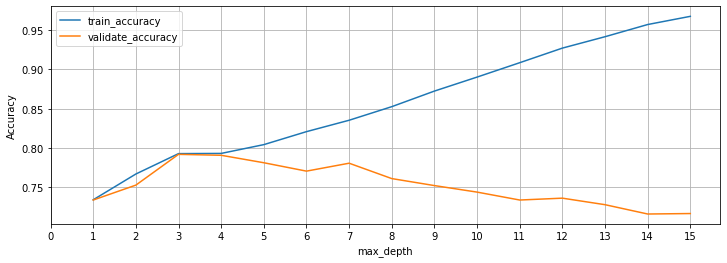

In [366]:
dtc_graph = []
for i in range(1, 16):
    dtc = DecisionTreeClassifier(max_depth = i, random_state = 123)
    dtc = dtc.fit(X_train, y_train)
    y_pred = dtc.predict(X_train)
    dtc_evaluation_df = {"max_depth": i, "train_accuracy": dtc.score(X_train, y_train), "validate_accuracy": dtc.score(X_validate, y_validate)}
    dtc_graph.append(dtc_evaluation_df)

dtc_accuracy_graph = pd.DataFrame(dtc_graph)

dtc_accuracy_graph.set_index('max_depth', inplace = True)
dtc_accuracy_graph.plot(figsize = (12,4))
plt.ylabel('Accuracy')
plt.xticks(np.arange(0,16,1))
plt.grid(b = True)

In [ ]:
# random forest

In [367]:
X_train = train.drop(columns=['churn'])
y_train = train.churn

X_validate = validate.drop(columns=['churn'])
y_validate = validate.churn

X_test = test.drop(columns=['churn'])
y_test = test.churn

In [368]:
rf = RandomForestClassifier(max_depth = 10,
                           random_state = 123, 
                           min_samples_leaf = 1)

In [369]:
rf.fit(X_train, y_train)

RandomForestClassifier(max_depth=10, random_state=123)

In [382]:
y_pred = rf.predict(X_train)

In [385]:
print('Accuracy of random forest classifier on train set: {:.2f}'.format(rf.score(X_train, y_train)))

Accuracy of random forest classifier on train set: 0.90


In [386]:
c_m = confusion_matrix(y_train, y_pred)
c_m

array([[2766,  125],
       [ 272,  774]])

In [374]:
# 0 = did not churn, 1 = churned
print(classification_report(y_train, y_pred))

              precision    recall  f1-score   support

          No       0.91      0.96      0.93      2891
         Yes       0.86      0.74      0.80      1046

    accuracy                           0.90      3937
   macro avg       0.89      0.85      0.86      3937
weighted avg       0.90      0.90      0.90      3937



In [379]:
print('Accuracy of random forest classifier on test set: {:.2f}'.format(rf.score(X_validate, y_validate)))

Accuracy of random forest classifier on test set: 0.79


In [389]:
y_pred = rf.predict(X_validate)
c_m = confusion_matrix(y_validate, y_pred)
c_m

array([[1106,  133],
       [ 218,  231]])

In [390]:
labels = ['Did not churn', 'Churned']
print('Actual on the left, predicted on the top')
pd.DataFrame(c_m, index = labels, columns = labels)

Actual on the left, predicted on the top


,Did not churn,Churned
Did not churn,1106,133
Churned,218,231


In [391]:
y_pred = rf.predict(X_validate)
print(classification_report(y_validate, y_pred))

              precision    recall  f1-score   support

          No       0.84      0.89      0.86      1239
         Yes       0.63      0.51      0.57       449

    accuracy                           0.79      1688
   macro avg       0.73      0.70      0.72      1688
weighted avg       0.78      0.79      0.78      1688



In [395]:
for i in range(1, 16):
    print('max_depth value: {}'.format(i))
    rf = RandomForestClassifier(max_depth = i,
                           random_state = 123, 
                           min_samples_leaf = 1)
    rf = rf.fit(X_train, y_train)
    y_pred = rf.predict(X_train)
    print('Accuracy of Decision Tree classifier on training set: {:.2f}'.format(rf.score(X_train, y_train)))
    print(classification_report(y_train, y_pred))
    print('Accuracy of Decision Tree classifier on validate set: {:.2f}'.format(rf.score(X_validate, y_validate)))
    y_pred = rf.predict(X_validate)
    print(classification_report(y_validate, y_pred))
    print('-------------------------------------------------')

max_depth value: 1
Accuracy of Decision Tree classifier on training set: 0.73
              precision    recall  f1-score   support

          No       0.73      1.00      0.85      2891
         Yes       0.00      0.00      0.00      1046

    accuracy                           0.73      3937
   macro avg       0.37      0.50      0.42      3937
weighted avg       0.54      0.73      0.62      3937

Accuracy of Decision Tree classifier on validate set: 0.73
              precision    recall  f1-score   support

          No       0.73      1.00      0.85      1239
         Yes       0.00      0.00      0.00       449

    accuracy                           0.73      1688
   macro avg       0.37      0.50      0.42      1688
weighted avg       0.54      0.73      0.62      1688

-------------------------------------------------
max_depth value: 2
Accuracy of Decision Tree classifier on training set: 0.77
              precision    recall  f1-score   support

          No       0.76   

Accuracy of Decision Tree classifier on training set: 0.94
              precision    recall  f1-score   support

          No       0.95      0.97      0.96      2891
         Yes       0.91      0.85      0.88      1046

    accuracy                           0.94      3937
   macro avg       0.93      0.91      0.92      3937
weighted avg       0.94      0.94      0.94      3937

Accuracy of Decision Tree classifier on validate set: 0.78
              precision    recall  f1-score   support

          No       0.83      0.88      0.86      1239
         Yes       0.61      0.52      0.56       449

    accuracy                           0.78      1688
   macro avg       0.72      0.70      0.71      1688
weighted avg       0.77      0.78      0.78      1688

-------------------------------------------------
max_depth value: 12
Accuracy of Decision Tree classifier on training set: 0.97
              precision    recall  f1-score   support

          No       0.98      0.98      0.98 

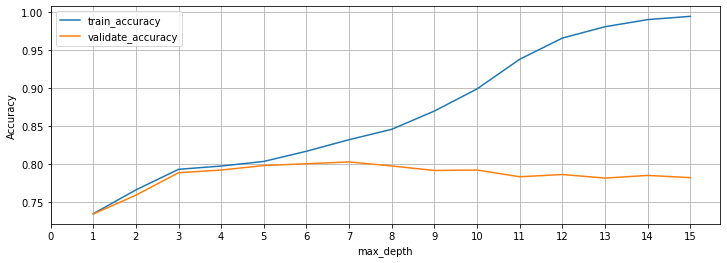

In [396]:
rf_graph = []
for i in range(1, 16):
    rf = RandomForestClassifier(max_depth = i,
                           random_state = 123, 
                           min_samples_leaf = 1)
    rf = rf.fit(X_train, y_train)
    y_pred = rf.predict(X_train)
    rf_evaluation_df = {"max_depth": i, "train_accuracy": rf.score(X_train, y_train), "validate_accuracy": rf.score(X_validate, y_validate)}
    rf_graph.append(rf_evaluation_df)

rf_accuracy_graph = pd.DataFrame(rf_graph)

rf_accuracy_graph.set_index('max_depth', inplace = True)
rf_accuracy_graph.plot(figsize = (12,4))
plt.ylabel('Accuracy')
plt.xticks(np.arange(0,16,1))
plt.grid(b = True)

In [ ]:
# knn

In [397]:
X_train = train.drop(columns=['churn'])
y_train = train.churn

X_validate = validate.drop(columns=['churn'])
y_validate = validate.churn

X_test = test.drop(columns=['churn'])
y_test = test.churn

In [398]:
knn = KNeighborsClassifier(n_neighbors = 5, weights = 'uniform')

In [399]:
knn.fit(X_train, y_train)

KNeighborsClassifier()

In [400]:
y_pred = knn.predict(X_train)

In [402]:
print(confusion_matrix(y_train, y_pred))

[[2652  239]
 [ 463  583]]


In [401]:
print('Accuracy of KNN classifier on training set: {:.2f}'
     .format(knn.score(X_train, y_train)))

Accuracy of KNN classifier on training set: 0.82


In [403]:
print(classification_report(y_train, y_pred))

              precision    recall  f1-score   support

          No       0.85      0.92      0.88      2891
         Yes       0.71      0.56      0.62      1046

    accuracy                           0.82      3937
   macro avg       0.78      0.74      0.75      3937
weighted avg       0.81      0.82      0.81      3937



In [404]:
print('Accuracy of KNN classifier on validate set: {:.2f}'
     .format(knn.score(X_validate, y_validate)))

Accuracy of KNN classifier on validate set: 0.77


In [405]:
y_pred = knn.predict(X_validate)
print(classification_report(y_validate, y_pred))

              precision    recall  f1-score   support

          No       0.82      0.88      0.85      1239
         Yes       0.58      0.45      0.51       449

    accuracy                           0.77      1688
   macro avg       0.70      0.67      0.68      1688
weighted avg       0.75      0.77      0.76      1688



In [419]:
for i in range(1, 16):
    print('max_depth value: {}'.format(i))
    knn = KNeighborsClassifier(n_neighbors = i, weights = 'uniform')
    knn = knn.fit(X_train, y_train)
    y_pred = knn.predict(X_train)
    print('Accuracy of KNN classifier on training set: {:.2f}'.format(knn.score(X_train, y_train)))
    print(classification_report(y_train, y_pred))
    print('Accuracy of KNN classifier on validate set: {:.2f}'.format(knn.score(X_validate, y_validate)))
    y_pred = knn.predict(X_validate)
    print(classification_report(y_validate, y_pred))
    print('-------------------------------------------------')

max_depth value: 1
Accuracy of KNN classifier on training set: 1.00
              precision    recall  f1-score   support

          No       1.00      1.00      1.00      2891
         Yes       1.00      1.00      1.00      1046

    accuracy                           1.00      3937
   macro avg       1.00      1.00      1.00      3937
weighted avg       1.00      1.00      1.00      3937

Accuracy of KNN classifier on validate set: 0.71
              precision    recall  f1-score   support

          No       0.81      0.80      0.80      1239
         Yes       0.46      0.48      0.47       449

    accuracy                           0.71      1688
   macro avg       0.64      0.64      0.64      1688
weighted avg       0.72      0.71      0.71      1688

-------------------------------------------------
max_depth value: 2
Accuracy of KNN classifier on training set: 0.86
              precision    recall  f1-score   support

          No       0.84      1.00      0.91      2891
  

Accuracy of KNN classifier on training set: 0.81
              precision    recall  f1-score   support

          No       0.83      0.93      0.88      2891
         Yes       0.71      0.46      0.56      1046

    accuracy                           0.81      3937
   macro avg       0.77      0.70      0.72      3937
weighted avg       0.79      0.81      0.79      3937

Accuracy of KNN classifier on validate set: 0.78
              precision    recall  f1-score   support

          No       0.81      0.91      0.86      1239
         Yes       0.64      0.43      0.51       449

    accuracy                           0.78      1688
   macro avg       0.73      0.67      0.69      1688
weighted avg       0.77      0.78      0.77      1688

-------------------------------------------------
max_depth value: 12
Accuracy of KNN classifier on training set: 0.80
              precision    recall  f1-score   support

          No       0.81      0.95      0.87      2891
         Yes       0

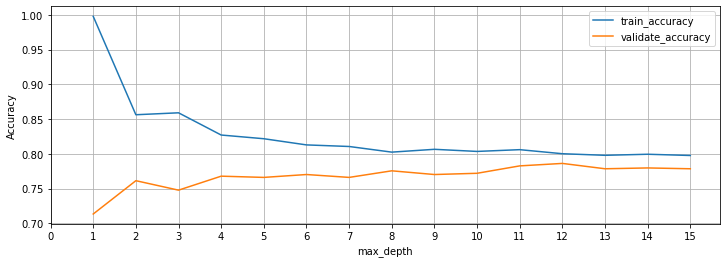

In [407]:
knn_graph = []
for i in range(1, 16):
    knn = KNeighborsClassifier(n_neighbors = i, weights = 'uniform')
    knn = knn.fit(X_train, y_train)
    y_pred = knn.predict(X_train)
    knn_evaluation_df = {"max_depth": i, "train_accuracy": knn.score(X_train, y_train), "validate_accuracy": knn.score(X_validate, y_validate)}
    knn_graph.append(knn_evaluation_df)

knn_accuracy_graph = pd.DataFrame(knn_graph)

knn_accuracy_graph.set_index('max_depth', inplace = True)
knn_accuracy_graph.plot(figsize = (12,4))
plt.ylabel('Accuracy')
plt.xticks(np.arange(0,16,1))
plt.grid(b = True)

In [ ]:
# regression model

In [408]:
X_train = train.drop(columns=['churn'])
y_train = train.churn

X_validate = validate.drop(columns=['churn'])
y_validate = validate.churn

X_test = test.drop(columns=['churn'])
y_test = test.churn

In [409]:
lr = LogisticRegression(C = 1, random_state = 123)

In [411]:
lr.fit(X_train, y_train)

LogisticRegression(C=1, random_state=123)

In [412]:
print('Coefficient: \n', lr.coef_)
print('Intercept: \n', lr.intercept_)

Coefficient: 
 [[ 2.90620997e-01 -4.46942470e-02 -5.29541106e-03  1.16794841e-04
  -1.70898079e-01 -1.13535156e-01 -2.12975128e-02 -2.11090580e-01
  -4.93826274e-01  1.14299320e-01 -3.93333991e-01 -6.04505507e-02
  -7.33376399e-02 -3.61221702e-01  8.36690856e-02  8.12041636e-02
   2.75690400e-01  3.31676528e-01 -2.86238934e-01 -3.29870828e-01
  -1.39823236e-01  3.14451880e-01 -4.59061879e-01  3.03977659e-03
  -1.82065272e-01  2.40337930e-01 -3.45745669e-01  1.47937873e-02]]
Intercept: 
 [-0.2859936]


In [413]:
y_pred = lr.predict(X_train)

In [414]:
print('Accuracy of Logistic Regression classifier on training set: {:.2f}'.format(lr.score(X_train, y_train)))

Accuracy of Logistic Regression classifier on training set: 0.80


In [415]:
print(confusion_matrix(y_train, y_pred))

[[2611  280]
 [ 491  555]]


In [416]:
# classification report
print(classification_report(y_train, y_pred))

              precision    recall  f1-score   support

          No       0.84      0.90      0.87      2891
         Yes       0.66      0.53      0.59      1046

    accuracy                           0.80      3937
   macro avg       0.75      0.72      0.73      3937
weighted avg       0.79      0.80      0.80      3937



In [417]:
print('Accuracy of Logistic Regression classifier on validate set: {:.2f}'
     .format(lr.score(X_validate, y_validate)))

Accuracy of Logistic Regression classifier on validate set: 0.79


In [418]:
y_pred = lr.predict(X_validate)
print(classification_report(y_validate, y_pred))

              precision    recall  f1-score   support

          No       0.84      0.89      0.86      1239
         Yes       0.63      0.53      0.58       449

    accuracy                           0.79      1688
   macro avg       0.74      0.71      0.72      1688
weighted avg       0.78      0.79      0.79      1688



In [425]:
for i in np.arange(.1, 1.6, .1):
    print('C value: {}'.format(i))
    lr = LogisticRegression(C = i, random_state = 123)
    lr = lr.fit(X_train, y_train)
    y_pred = lr.predict(X_train)
    print('Accuracy of Logistic Regression classifier on training set: {:.2f}'.format(lr.score(X_train, y_train)))
    print(classification_report(y_train, y_pred))
    print('Accuracy of Logistic Regression classifier on validate set: {:.2f}'.format(lr.score(X_validate, y_validate)))
    y_pred = lr.predict(X_validate)
    print(classification_report(y_validate, y_pred))
    print('-------------------------------------------------')

C value: 0.1
Accuracy of Logistic Regression classifier on training set: 0.80
              precision    recall  f1-score   support

          No       0.84      0.90      0.87      2891
         Yes       0.66      0.54      0.59      1046

    accuracy                           0.80      3937
   macro avg       0.75      0.72      0.73      3937
weighted avg       0.79      0.80      0.80      3937

Accuracy of Logistic Regression classifier on validate set: 0.79
              precision    recall  f1-score   support

          No       0.84      0.88      0.86      1239
         Yes       0.63      0.54      0.58       449

    accuracy                           0.79      1688
   macro avg       0.73      0.71      0.72      1688
weighted avg       0.78      0.79      0.79      1688

-------------------------------------------------
C value: 0.2
Accuracy of Logistic Regression classifier on training set: 0.80
              precision    recall  f1-score   support

          No       0

              precision    recall  f1-score   support

          No       0.85      0.89      0.87      2891
         Yes       0.65      0.55      0.60      1046

    accuracy                           0.80      3937
   macro avg       0.75      0.72      0.73      3937
weighted avg       0.79      0.80      0.80      3937

Accuracy of Logistic Regression classifier on validate set: 0.79
              precision    recall  f1-score   support

          No       0.84      0.88      0.86      1239
         Yes       0.62      0.55      0.58       449

    accuracy                           0.79      1688
   macro avg       0.73      0.72      0.72      1688
weighted avg       0.78      0.79      0.79      1688

-------------------------------------------------
C value: 1.2000000000000002
Accuracy of Logistic Regression classifier on training set: 0.80
              precision    recall  f1-score   support

          No       0.85      0.89      0.87      2891
         Yes       0.65      

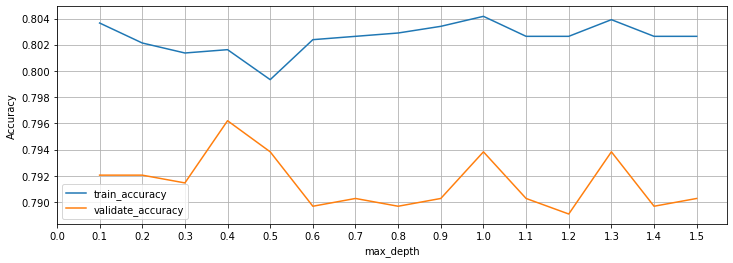

In [424]:
lr_graph = []
for i in np.arange(.1, 1.6, .1):
    lr = LogisticRegression(C = i, random_state = 123)
    lr = lr.fit(X_train, y_train)
    y_pred = lr.predict(X_train)
    lr_evaluation_df = {"max_depth": i, "train_accuracy": lr.score(X_train, y_train), "validate_accuracy": lr.score(X_validate, y_validate)}
    lr_graph.append(lr_evaluation_df)

lr_accuracy_graph = pd.DataFrame(lr_graph)

lr_accuracy_graph.set_index('max_depth', inplace = True)
lr_accuracy_graph.plot(figsize = (12,4))
plt.ylabel('Accuracy')
plt.xticks(np.arange(0,1.6,.1))
plt.grid(b = True)

In [ ]:
# Evaluate model

In [426]:
X_train = train.drop(columns=['churn'])
y_train = train.churn

X_validate = validate.drop(columns=['churn'])
y_validate = validate.churn

X_test = test.drop(columns=['churn'])
y_test = test.churn

In [431]:
rf = RandomForestClassifier(max_depth = 5,
                           random_state = 123, 
                           min_samples_leaf = 1)

In [432]:
rf.fit(X_train, y_train)

RandomForestClassifier(max_depth=5, random_state=123)

In [433]:
print('Accuracy of random forest classifier on train set: {:.2f}'.format(rf.score(X_train, y_train)))
print('Accuracy of random forest classifier on validate set: {:.2f}'.format(rf.score(X_validate, y_validate)))
print('Accuracy of random forest classifier on test set: {:.2f}'.format(rf.score(X_test, y_test)))

Accuracy of random forest classifier on train set: 0.80
Accuracy of random forest classifier on validate set: 0.80
Accuracy of random forest classifier on test set: 0.79


In [443]:
y_prediction = rf.predict(X_test)
test_probability = rf.predict_proba(X_test)
test_probability_df = pd.concat([X_test.reset_index(), pd.DataFrame(test_probability, columns = ['Did not churn', 'Churned'])], axis = 1)
test_probability_df['predictions'] = rf.predict(X_test)
test_probability_df = test_probability_df[['index', 'Did not churn', 'Churned', 'predictions']]
df = telco_data()
predictions = test_probability_df.merge(df, left_on = 'index', right_index = True)
predictions = predictions[['customer_id', 'Did not churn', 'Churned', 'predictions']]
predictions.set_index('customer_id', inplace = True)
predictions.to_csv('predictions.csv')